# importing the required libraries for the data

In [2]:
import pandas as pd
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
import sqlite3
from pandas_profiling import ProfileReport
from sklearn.preprocessing import StandardScaler
import plotly.express as px
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.preprocessing import LabelEncoder
import statsmodels.api as sma
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,classification_report,cohen_kappa_score,confusion_matrix
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import DecisionTreeClassifier,plot_tree
from sklearn.tree import plot_tree 
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.metrics import accuracy_score,confusion_matrix,roc_curve,classification_report,roc_auc_score
from sklearn.model_selection import GridSearchCV
from xgboost import XGBClassifier
from sklearn.decomposition import PCA

from sklearn.cluster import DBSCAN,KMeans
from yellowbrick.cluster import KElbowVisualizer,SilhouetteVisualizer

from sklearn.metrics import silhouette_score
from mlxtend.feature_selection import SequentialFeatureSelector
from sklearn.feature_selection import SequentialFeatureSelector

# Importing the dataset

In [5]:
df=pd.read_excel("ASIA (1).xlsx",na_filter="?")
df.head(2).T

,0,1
Type,DEBIT,TRANSFER
Days for shipping (real),3,5
Days for shipment (scheduled),4,4
Benefit per order,91.25,-249.089996
Sales per customer,314.640015,311.359985
Delivery Status,Advance shipping,Late delivery
Late_delivery_risk,0,1
Category Id,73,73
Category Name,Sporting Goods,Sporting Goods
Customer City,Caguas,Caguas


In [6]:
pd.set_option('display.max_columns', 50000) 


pd.set_option('display.max_columns', 50)

# shape of the data

In [7]:
df.shape

(31112, 53)

## Five point summary of the data
* Here we can see there are certain data points per exced the 75% mark but 
* we have not removed it because it could have a certain order from a customer 
* so we can't remove that data while considering it an outlier

In [8]:
df.describe(include = ob).T

,count,mean,std,min,25%,50%,75%,max
Days for shipping (real),31112.0,3.501864,1.620299,0.000000,2.000000,3.000000,5.000000,6.000000
Days for shipment (scheduled),31112.0,2.928227,1.369959,0.000000,2.000000,4.000000,4.000000,4.000000
Benefit per order,31112.0,21.093964,103.942982,-2592.000000,5.420000,29.250000,63.705001,684.000000
Sales per customer,31112.0,180.774817,123.989226,7.490000,97.959999,163.770004,247.399994,1500.000000
Late_delivery_risk,31112.0,0.553806,0.497105,0.000000,0.000000,1.000000,1.000000,1.000000
Category Id,31112.0,35.616547,18.857814,3.000000,18.000000,36.000000,46.000000,76.000000
Customer Id,31112.0,7826.919099,5241.128419,1.000000,3656.000000,7205.000000,10807.250000,20756.000000
Customer Zipcode,31111.0,36205.207322,37675.713964,603.000000,725.000000,19702.000000,78520.000000,99205.000000
Department Id,31112.0,5.609636,1.861662,2.000000,4.000000,5.000000,7.000000,12.000000
Latitude,31112.0,29.707622,9.782261,-33.937553,18.266007,33.168343,39.114024,48.781933


### There is are few null columns
* "Order Zipcode" and "Product Description" contains 90 percentage of missing data sho we are roping it


In [9]:
df.isnull().sum()/df.isn

Type                                 0
Days for shipping (real)             0
Days for shipment (scheduled)        0
Benefit per order                    0
Sales per customer                   0
Delivery Status                      0
Late_delivery_risk                   0
Category Id                          0
Category Name                        0
Customer City                        0
Customer Country                     0
Customer Email                       0
Customer Fname                       0
Customer Id                          0
Customer Lname                       5
Customer Password                    0
Customer Segment                     0
Customer State                       0
Customer Street                      0
Customer Zipcode                     1
Department Id                        0
Department Name                      0
Latitude                             0
Longitude                            0
Market                               0
Order City               

In [ ]:
df['Customer City'].value_counts(normalize =True)

In [ ]:
df['Customer City'].nuique()

### checking the datatypes and null count of the both categorical and  numerical columns

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31112 entries, 0 to 31111
Data columns (total 53 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Type                           31112 non-null  object 
 1   Days for shipping (real)       31112 non-null  int64  
 2   Days for shipment (scheduled)  31112 non-null  int64  
 3   Benefit per order              31112 non-null  float64
 4   Sales per customer             31112 non-null  float64
 5   Delivery Status                31112 non-null  object 
 6   Late_delivery_risk             31112 non-null  int64  
 7   Category Id                    31112 non-null  int64  
 8   Category Name                  31112 non-null  object 
 9   Customer City                  31112 non-null  object 
 10  Customer Country               31112 non-null  object 
 11  Customer Email                 31112 non-null  object 
 12  Customer Fname                 31112 non-null 

###  Identifying unique values in every columns

In [11]:
# identifying unique values in every columns
df.nunique().reset_index()

,index,0
0,Type,4
1,Days for shipping (real),7
2,Days for shipment (scheduled),4
3,Benefit per order,11490
4,Sales per customer,1879
5,Delivery Status,4
6,Late_delivery_risk,2
7,Category Id,43
8,Category Name,42
9,Customer City,560


###  Analysing Category id and category name
* pre-processing, since the values are different but these are both related to each other so the values should be same

In [12]:
# Analysing Category id and category name
# pre-processing, since the values are different but these are both related to each other so the values should be same
print(df.groupby('Category Name')['Category Id'].nunique())

Category Name
Accessories             1
Baby                    1
Baseball & Softball     1
Books                   1
Boxing & MMA            1
CDs                     1
Cameras                 1
Camping & Hiking        1
Cardio Equipment        1
Children's Clothing     1
Cleats                  1
Computers               1
Consumer Electronics    1
Crafts                  1
DVDs                    1
Electronics             2
Fishing                 1
Fitness Accessories     1
Garden                  1
Girls' Apparel          1
Golf Apparel            1
Golf Balls              1
Golf Gloves             1
Golf Shoes              1
Health and Beauty       1
Hockey                  1
Hunting & Shooting      1
Indoor/Outdoor Games    1
Lacrosse                1
Men's Clothing          1
Men's Footwear          1
Music                   1
Pet Supplies            1
Shop By Sport           1
Sporting Goods          1
Tennis & Racquet        1
Toys                    1
Trade-In                

* here we can see that the "Electroics" has two unique groups

In [13]:
# using sql queery in python


df.query("`Days for shipping (real)`==3")\
.sort_values(by="Days for shipment (scheduled)",ascending=False)


,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Id,Category Name,Customer City,Customer Country,Customer Email,Customer Fname,Customer Id,Customer Lname,Customer Password,Customer Segment,Customer State,Customer Street,Customer Zipcode,Department Id,Department Name,Latitude,Longitude,Market,...,order date (DateOrders),Order Id,Order Item Cardprod Id,Order Item Discount,Order Item Discount Rate,Order Item Id,Order Item Product Price,Order Item Profit Ratio,Order Item Quantity,Sales,Order Item Total,Order Profit Per Order,Order Region,Order State,Order Status,Order Zipcode,Product Card Id,Product Category Id,Product Description,Product Image,Product Name,Product Price,Product Status,shipping date (DateOrders),Shipping Mode
0,DEBIT,3,4,91.250000,314.640015,Advance shipping,0,73,Sporting Goods,Caguas,Puerto Rico,XXXXXXXXX,Cally,20755,Holloway,XXXXXXXXX,Consumer,PR,5365 Noble Nectar Island,725.0,2,Fitness,18.251453,-66.037056,Pacific Asia,...,1/31/2018 22:56,77202,1360,13.11,0.04,180517,327.750000,0.29,1,327.750000,314.640015,91.250000,Southeast Asia,Java Occidental,COMPLETE,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.750000,0,2018-03-02 22:56:00,Standard Class
20790,DEBIT,3,4,82.639999,284.970001,Advance shipping,0,9,Cardio Equipment,New York,EE. UU.,XXXXXXXXX,Mary,6925,Smith,XXXXXXXXX,Consumer,NY,4294 Foggy By-pass,10029.0,3,Footwear,40.792900,-73.944267,Pacific Asia,...,10/25/2015 3:36,20357,191,15.00,0.05,50824,99.989998,0.29,3,299.970001,284.970001,82.639999,Southeast Asia,Sabah,COMPLETE,NaN,191,9,NaN,http://images.acmesports.sports/Nike+Men%27s+F...,Nike Men's Free 5.0+ Running Shoe,99.989998,0,10/28/2015 3:36,Standard Class
20734,DEBIT,3,4,30.340000,82.000000,Advance shipping,0,24,Women's Apparel,Jersey City,EE. UU.,XXXXXXXXX,James,5398,Rogers,XXXXXXXXX,Consumer,NJ,5497 Quiet Landing,7307.0,5,Golf,40.747261,-74.049088,Pacific Asia,...,11/15/2015 4:06,21797,502,18.00,0.18,54515,50.000000,0.37,2,100.000000,82.000000,30.340000,Eastern Asia,Pekín,COMPLETE,NaN,502,24,NaN,http://images.acmesports.sports/Nike+Men%27s+D...,Nike Men's Dri-FIT Victory Golf Polo,50.000000,0,11/18/2015 4:06,Standard Class
20735,DEBIT,3,4,36.900002,82.000000,Advance shipping,0,24,Women's Apparel,Jersey City,EE. UU.,XXXXXXXXX,Mary,3187,Clark,XXXXXXXXX,Consumer,NJ,3886 Blue Zephyr Villas,7305.0,5,Golf,40.706020,-74.086853,Pacific Asia,...,1/22/2016 13:28,26482,502,18.00,0.18,66291,50.000000,0.45,2,100.000000,82.000000,36.900002,South Asia,Bihar,COMPLETE,NaN,502,24,NaN,http://images.acmesports.sports/Nike+Men%27s+D...,Nike Men's Dri-FIT Victory Golf Polo,50.000000,0,1/25/2016 13:28,Standard Class
20738,DEBIT,3,4,10.000000,80.000000,Advance shipping,0,24,Women's Apparel,Jersey City,EE. UU.,XXXXXXXXX,Mary,3187,Clark,XXXXXXXXX,Consumer,NJ,3886 Blue Zephyr Villas,7305.0,5,Golf,40.706020,-74.086853,Pacific Asia,...,1/22/2016 13:28,26482,502,20.00,0.20,66289,50.000000,0.13,2,100.000000,80.000000,10.000000,South Asia,Bihar,COMPLETE,NaN,502,24,NaN,http://images.acmesports.sports/Nike+Men%27s+D...,Nike Men's Dri-FIT Victory Golf Polo,50.000000,0,1/25/2016 13:28,Standard Class
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10928,DEBIT,3,2,22.309999,97.000000,Late delivery,1,24,Women's Apparel,Orlando,EE. UU.,XXXXXXXXX,Joseph,5300,Smith,XXXXXXXXX,Consumer,FL,6651 Iron Port,32822.0,5,Golf,28.516270,-81.305832,Pacific Asia,...,12/28/2016 6:30,49822,502,3.00,0.03,124552,50.000000,0.23,2,100.000000,97.000000,22.309999,West Asia,Bagdad,COMPLETE,NaN,502,24,NaN,http://images.acmesports.sports/Nike+Men%27s+D...,Nike Men's Dri-FIT Victory Golf Polo,50.000000,0,12/31/2016 6:30,Second Class
10917,DEBIT,3,2,12.750000,101.980003,Late delivery,1,17,Cleats,Columbus,EE. UU.,XXXXXXXXX,Amber,4966,Bradley

* "Electronics" has 2 unique groups which is 13 and 37


In [14]:
df[['Category Name', 'Category Id']][df.groupby(df['Category Name'])['Category Id'].transform('nunique')==2]

,Category Name,Category Id
171,Electronics,13
177,Electronics,13
271,Electronics,13
284,Electronics,37
285,Electronics,37
...,...,...
30339,Electronics,37
30342,Electronics,37
30353,Electronics,13
30392,Electronics,37


* converting 37 and 13 to same categories 

In [15]:
df['Category Id'] = np.where(df['Category Id'] == 37, 13, df['Category Id'])
df[df['Category Name']=='Electronics']['Category Id'].value_counts()

13    614
Name: Category Id, dtype: int64

* checking all unique values again

In [16]:
df.nunique()

Type                                 4
Days for shipping (real)             7
Days for shipment (scheduled)        4
Benefit per order                11490
Sales per customer                1879
Delivery Status                      4
Late_delivery_risk                   2
Category Id                         42
Category Name                       42
Customer City                      560
Customer Country                     2
Customer Email                       1
Customer Fname                     766
Customer Id                      10580
Customer Lname                    1079
Customer Password                    1
Customer Segment                     3
Customer State                      45
Customer Street                   5408
Customer Zipcode                   990
Department Id                       11
Department Name                     11
Latitude                          6654
Longitude                         3055
Market                               1
Order City               

In [17]:
df1 = df.select_dtypes(include=np.number).head(2)

,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Late_delivery_risk,Category Id,Customer Id,Customer Zipcode,Department Id,Latitude,Longitude,Order Customer Id,Order Id,Order Item Cardprod Id,Order Item Discount,Order Item Discount Rate,Order Item Id,Order Item Product Price,Order Item Profit Ratio,Order Item Quantity,Sales,Order Item Total,Order Profit Per Order,Order Zipcode,Product Card Id,Product Category Id,Product Description,Product Price,Product Status
0,3,4,91.250000,314.640015,0,73,20755,725.0,2,18.251453,-66.037056,20755,77202,1360,13.110000,0.04,180517,327.75,0.29,1,327.75,314.640015,91.250000,NaN,1360,73,NaN,327.75,0
1,5,4,-249.089996,311.359985,1,73,19492,725.0,2,18.279451,-66.037064,19492,75939,1360,16.389999,0.05,179254,327.75,-0.80,1,327.75,311.359985,-249.089996,NaN,1360,73,NaN,327.75,0


* seperating  time and date from order date(DateOrders) column 

In [18]:
df["order date (DateOrders)"]=pd.to_datetime(df["order date (DateOrders)"])

In [19]:
df["year"]=df["order date (DateOrders)"].dt.year
df["month"]=df["order date (DateOrders)"].dt.month
df["day"]=df["order date (DateOrders)"].dt.day

In [20]:
df["time"]=df["order date (DateOrders)"].dt.time

In [21]:
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

In [132]:
df['Type'].value_counts()

1    11733
3     8548
2     7511
0     3320
Name: Type, dtype: int64

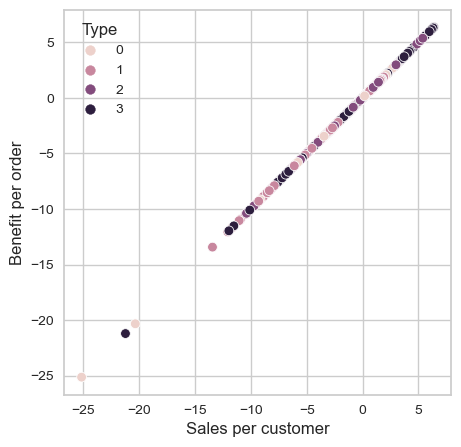

In [134]:
plt.figure(figsize=(5,5))
sns.scatterplot(x= 'Sales per customer',y = 'Benefit per order',data=df,hue='Type')
plt.show()

In [22]:
df

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Id,Category Name,Customer City,Customer Country,Customer Email,Customer Fname,Customer Id,Customer Lname,Customer Password,Customer Segment,Customer State,Customer Street,Customer Zipcode,Department Id,Department Name,Latitude,Longitude,Market,...,Order Item Discount Rate,Order Item Id,Order Item Product Price,Order Item Profit Ratio,Order Item Quantity,Sales,Order Item Total,Order Profit Per Order,Order Region,Order State,Order Status,Order Zipcode,Product Card Id,Product Category Id,Product Description,Product Image,Product Name,Product Price,Product Status,shipping date (DateOrders),Shipping Mode,year,month,day,time
0,DEBIT,3,4,91.250000,314.640015,Advance shipping,0,73,Sporting Goods,Caguas,Puerto Rico,XXXXXXXXX,Cally,20755,Holloway,XXXXXXXXX,Consumer,PR,5365 Noble Nectar Island,725.0,2,Fitness,18.251453,-66.037056,Pacific Asia,...,0.04,180517,327.750000,0.29,1,327.750000,314.640015,91.250000,Southeast Asia,Java Occidental,COMPLETE,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.750000,0,2018-03-02 22:56:00,Standard Class,2018,1,31,22:56:00
1,TRANSFER,5,4,-249.089996,311.359985,Late delivery,1,73,Sporting Goods,Caguas,Puerto Rico,XXXXXXXXX,Irene,19492,Luna,XXXXXXXXX,Consumer,PR,2679 Rustic Loop,725.0,2,Fitness,18.279451,-66.037064,Pacific Asia,...,0.05,179254,327.750000,-0.80,1,327.750000,311.359985,-249.089996,South Asia,Rajastán,PENDING,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.750000,0,1/18/2018 12:27,Standard Class,2018,1,13,12:27:00
2,CASH,4,4,-247.779999,309.720001,Shipping on time,0,73,Sporting Goods,San Jose,EE. UU.,XXXXXXXXX,Gillian,19491,Maldonado,XXXXXXXXX,Consumer,CA,8510 Round Bear Gate,95125.0,2,Fitness,37.292233,-121.881279,Pacific Asia,...,0.06,179253,327.750000,-0.80,1,327.750000,309.720001,-247.779999,South Asia,Rajastán,CLOSED,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.750000,0,1/17/2018 12:06,Standard Class,2018,1,13,12:06:00
3,DEBIT,2,1,95.180000,288.420013,Late delivery,1,73,Sporting Goods,Caguas,Puerto Rico,XXXXXXXXX,Constance,19487,Terrell,XXXXXXXXX,Home Office,PR,1879 Green Pine Bank,725.0,2,Fitness,18.242538,-66.037056,Pacific Asia,...,0.12,179249,327.750000,0.33,1,327.750000,288.420013,95.180000,Eastern Asia,Guangdong,COMPLETE,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.750000,0,1/15/2018 10:42,First Class,2018,1,13,10:42:00
4,TRANSFER,2,1,68.430000,285.140015,Late delivery,1,73,Sporting Goods,Miami,EE. UU.,XXXXXXXXX,Erica,19486,Stevens,XXXXXXXXX,Corporate,FL,7595 Cotton Log Row,33162.0,2,Fitness,25.928869,-80.162872,Pacific Asia,...,0.13,179248,327.750000,0.24,1,327.750000,285.140015,68.430000,Eastern Asia,Guangdong,PROCESSING,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.750000,0,1/15/2018 10:21,First Class,2018,1,13,10:21:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31107,DEBIT,6,4,86.400002,319.980011,Late delivery,1,45,Fishing,Caguas,Puerto Rico,XXXXXXXXX,Mary,7396,Madden,XXXXXXXXX,Home Office,PR,9918 Lazy Cape,725.0,7,Fan Shop,18.245256,-66.370621,Pacific Asia,...,0.20,65194,399.980011,0.27,1,399.980011,319.980011,86.400002,Eastern Asia,Sichuan,COMPLETE,NaN,1004,45,NaN,http://images.acmesports.sports/Field+%26+Stre...,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,0,1/22/2016 6:07,Standard Class,2016,1,16,06:07:00
31108,PAYMENT,3,4,119.989998,299.989990,Advance shipping,0,45,Fishing,Lancaster,EE. UU.,XXXXXXXXX,Mary,3080,Smith,XXXXXXXXX,Home Office,OH,8600 Red Goose Abbey,43130.0,7,Fan Shop,39.715977,-82.599297,Pacific Asia,...,0.25,65185,399.980011,0.40,1,399.980011,299.989990,119.989998,Eastern Asia,Shanghái,PENDING_PAYMENT,NaN

###  identifying differnt columns as per the there values into numerical, ccategorical, drop and dependent 

In [23]:
# identifying differnt columns as per the there values into numerical, ccategorical, drop and dependent

df_num = df[['Benefit per order', 'Sales per customer', 'Customer Zipcode', 'Latitude', 'Longitude', 'Order Customer Id',\
'Order Id', 'Order Item Discount','Order Item Discount Rate','Order Item Product Price',\
'Order Item Profit Ratio', 'Sales', 'Order Item Total', 'Order Profit Per Order', 'Product Price',\
]]

df_cat = df[['Type', 'Days for shipping (real)', 'Days for shipment (scheduled)','Delivery Status','Category Id', 'Customer City',\
'Customer Country', 'Customer Segment','Department Id','Order City', 'Order Country', 'Order Item Cardprod Id',\
'Order Item Quantity','Order Region','Shipping Mode','Order Status', 'Order State']]


df_drop =df[['Category Name','Customer Email', 'Customer Fname', 'Customer Id','Customer Lname', 'Customer Password',\
'Customer Street', 'Customer State', 'Department Name', 'Market', 'Order Item Id','Order Zipcode','Product Card Id',
'Product Description', 'Product Image', 'Product Name','Product Status', 'Product Category Id',\
'order date (DateOrders)', 'shipping date (DateOrders)','year','month','day','time']]

y = df[['Late_delivery_risk']]

### univeriate
* checking the distribution of the numerical columns

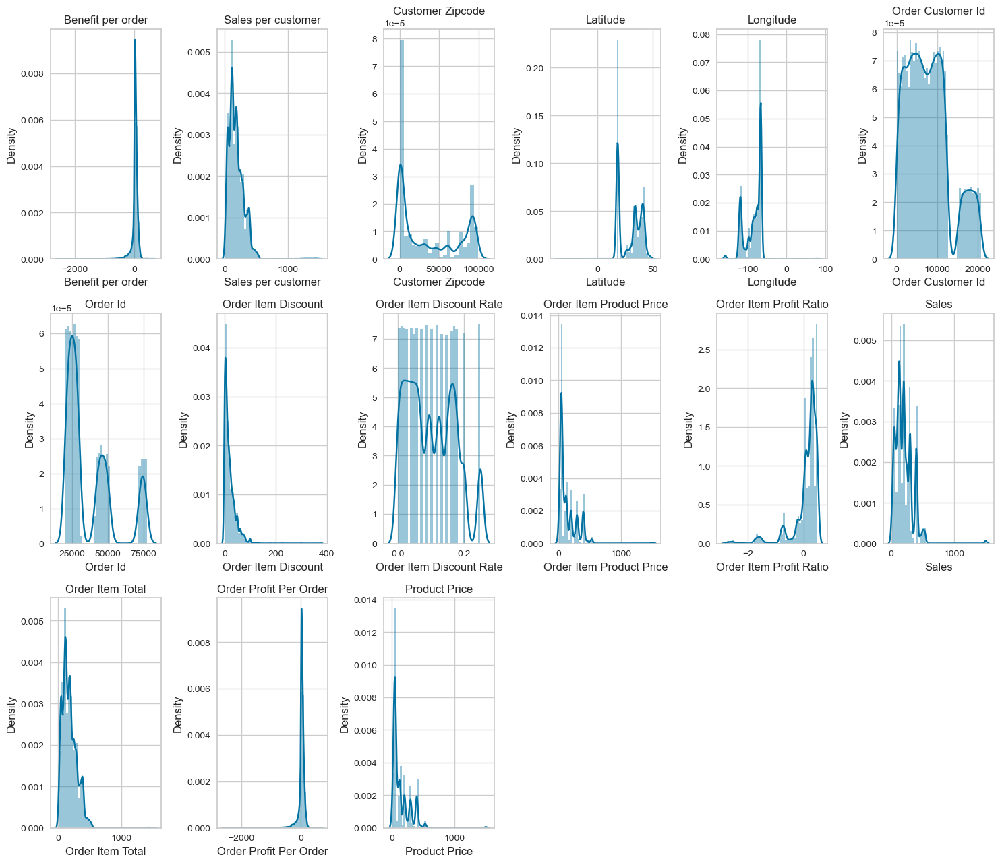

In [24]:
# checking the distribution of the numerical columns
# univeriate
t=1
plt.figure(figsize=(15,21))
for i in df_num:
    plt.subplot(5,6,t)
    sns.distplot(df_num[i])
    plt.title(i)
    t+=1
plt.tight_layout()
plt.show()

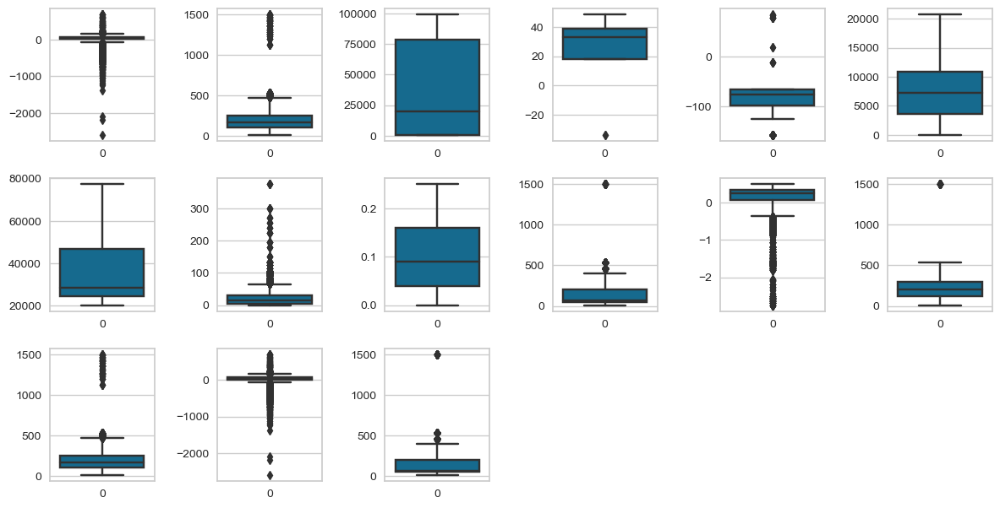

In [25]:
t=1
plt.figure(figsize=(12,10))
for i in df_num:
    plt.subplot(5,6,t)
    sns.boxplot(df[i])
    t+=1
plt.tight_layout()
plt.show()

In [26]:
# checking the if there is any type of "?" is prsent in the datq
filtered_df = df[df[df =="?"].any(axis=1)]
filtered_df

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Id,Category Name,Customer City,Customer Country,Customer Email,Customer Fname,Customer Id,Customer Lname,Customer Password,Customer Segment,Customer State,Customer Street,Customer Zipcode,Department Id,Department Name,Latitude,Longitude,Market,...,Order Item Discount Rate,Order Item Id,Order Item Product Price,Order Item Profit Ratio,Order Item Quantity,Sales,Order Item Total,Order Profit Per Order,Order Region,Order State,Order Status,Order Zipcode,Product Card Id,Product Category Id,Product Description,Product Image,Product Name,Product Price,Product Status,shipping date (DateOrders),Shipping Mode,year,month,day,time


In [27]:
# checking the shape of the seperated numerical variable

In [28]:
df_num.shape

(31112, 15)

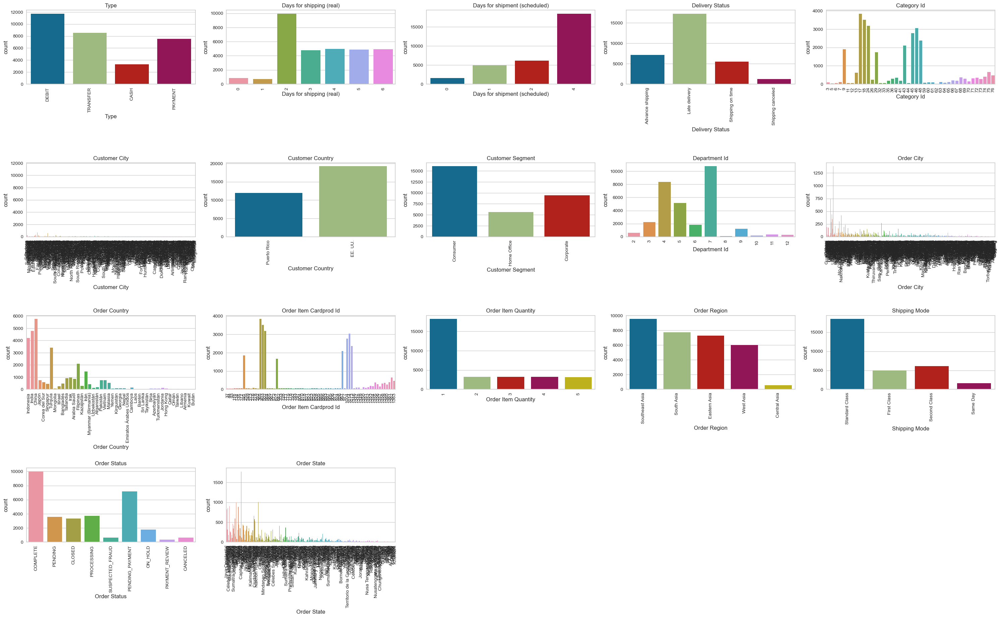

In [29]:
# checking the value and distribution of the categorical columns
# cat

t=1
plt.figure(figsize=(30,21))
for i in df_cat:
    plt.subplot(5,5,t)
    sns.countplot(data=df,x=df[i])
    plt.title(i)
    t+=1
    plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

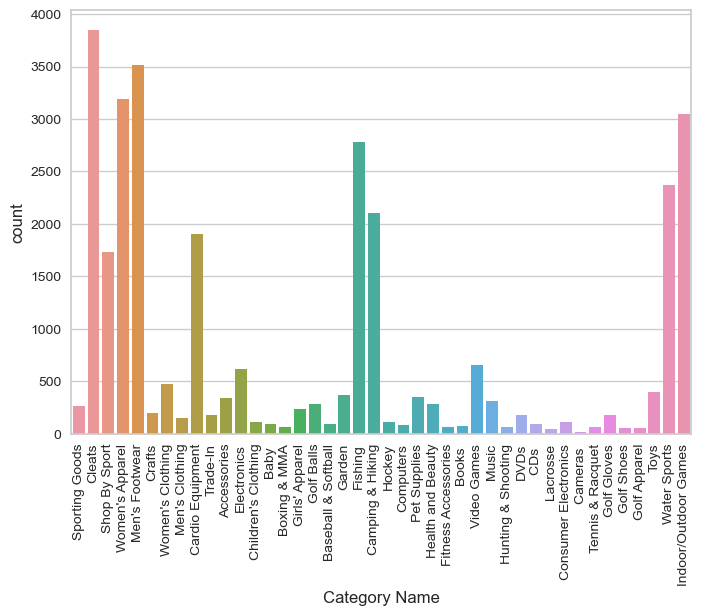

In [30]:
sns.countplot(x=df["Category Name"])
plt.xticks(rotation=90)
plt.show()

### we can see that 
* 8 category items which has more than 1500 counts are :-
* cleats,shop by sport,womens's apparel,men's footwear,cardio equipment,
* fishing, camping & Hiking, water sports , indoor/outdoor Games
* some category items have more than  or equal to 500 counts are:-
* womens's clothings, elctronics, video games
* rest of the items have less than 500 

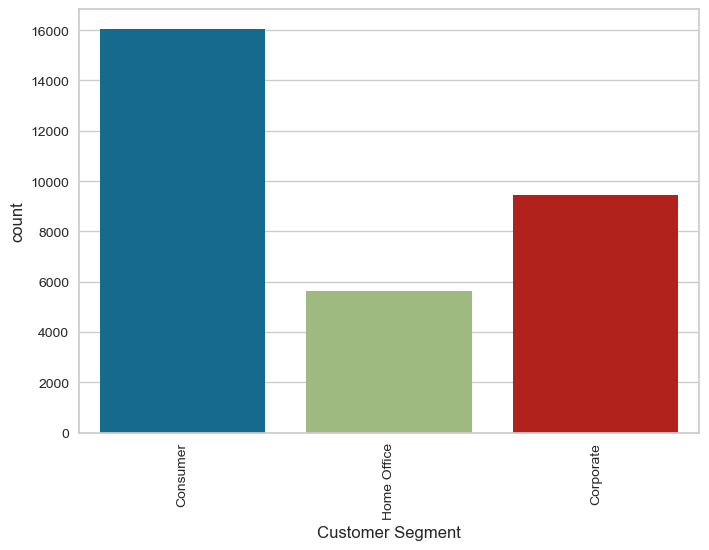

In [31]:
sns.countplot(x=df["Customer Segment"])
plt.xticks(rotation=90)
plt.show()

* conusmer has most peak counts nearly is 16000
* corporate is the second most nearly 10000
* Home office has more than 5000 

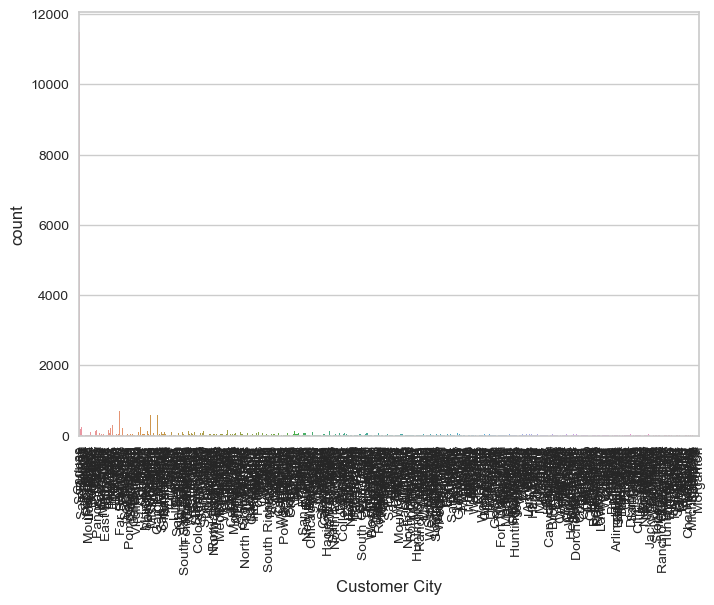

In [32]:
sns.countplot(x=df["Customer City"])
plt.xticks(rotation=90)
plt.show()

# Bivariate

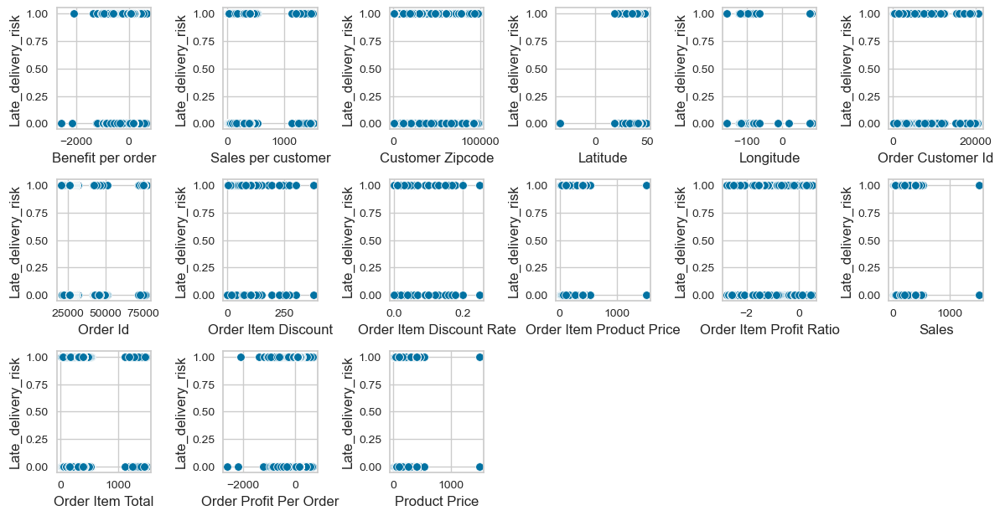

In [33]:
# Num vs num
t=1
plt.figure(figsize=(12,10))
for i in df_num:
    plt.subplot(5,6,t)
    sns.scatterplot(data=df,x=df.loc[:,i],y=df['Late_delivery_risk'])
    t+=1
plt.tight_layout()
plt.show()

* No linearity in the data

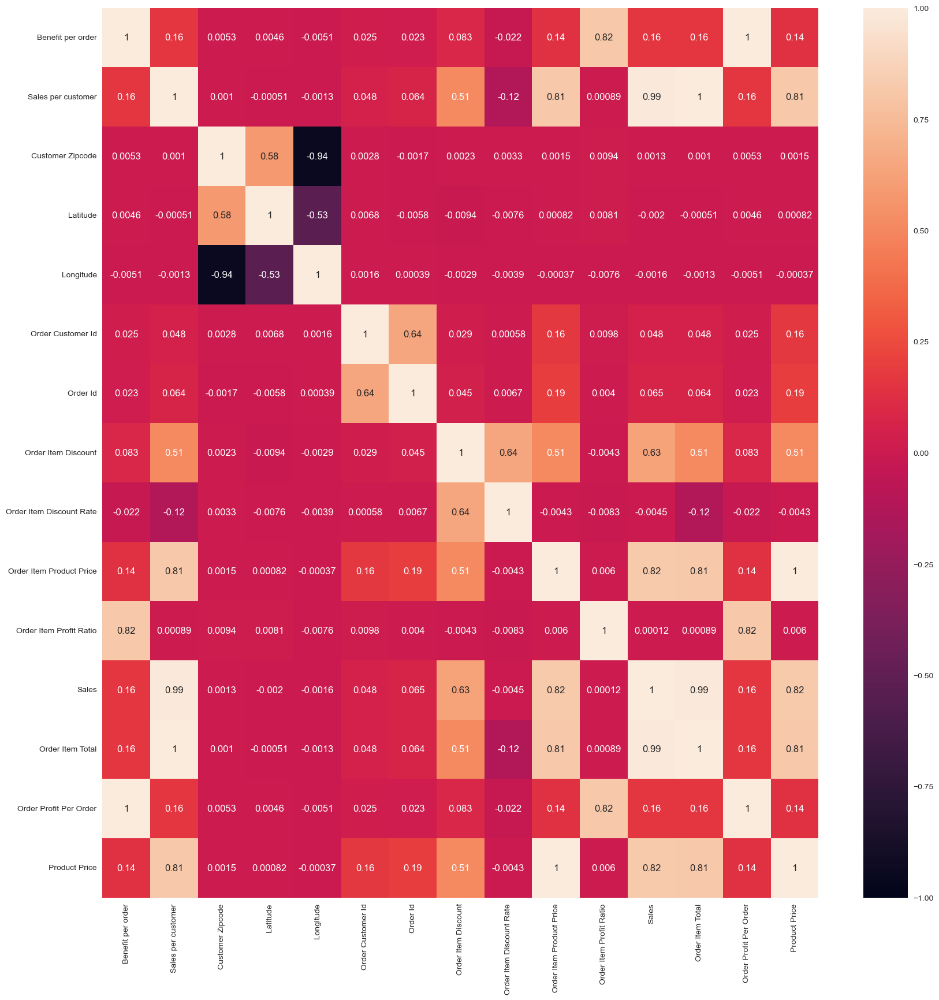

In [34]:
plt.figure(figsize=(20,20))
sns.heatmap(df_num.corr(),annot=True,vmin=-1,vmax=1)
plt.show()

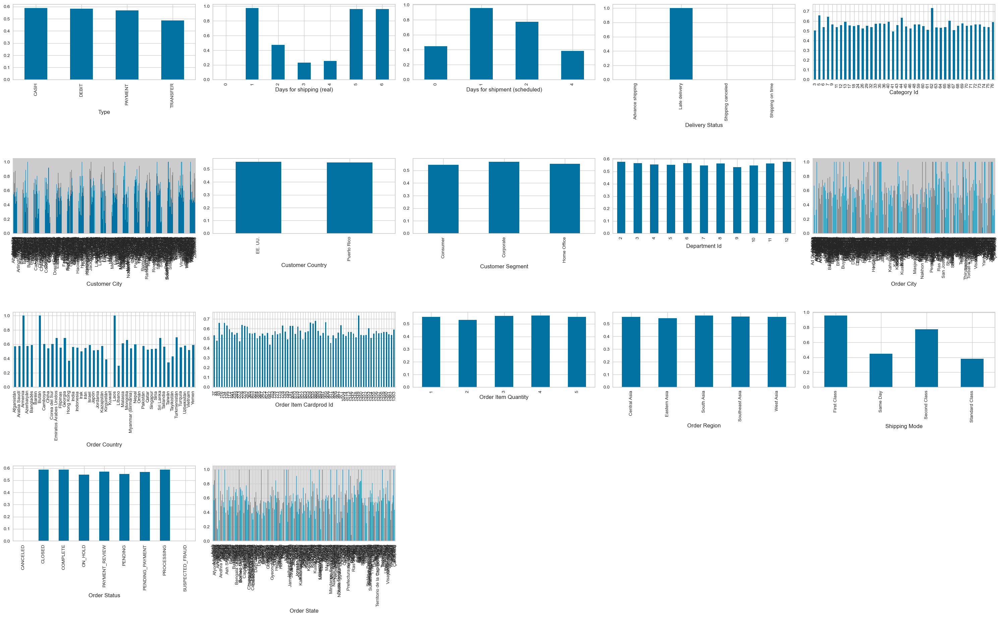

In [35]:
t=1
plt.figure(figsize=(30,21))
for i in df_cat:
    plt.subplot(5,5,t)
    df.groupby(i)['Late_delivery_risk'].mean().plot(kind='bar')
    plt.xticks(rotation=90)
    t+=1
plt.tight_layout()
plt.show()

#### some features which have extreme values are:-
* benifits per order,sales per customer,latitude,longitude,
* order item discount,order item products price,order item  profit ratio,
* sales,order item total,order profit per order,product price

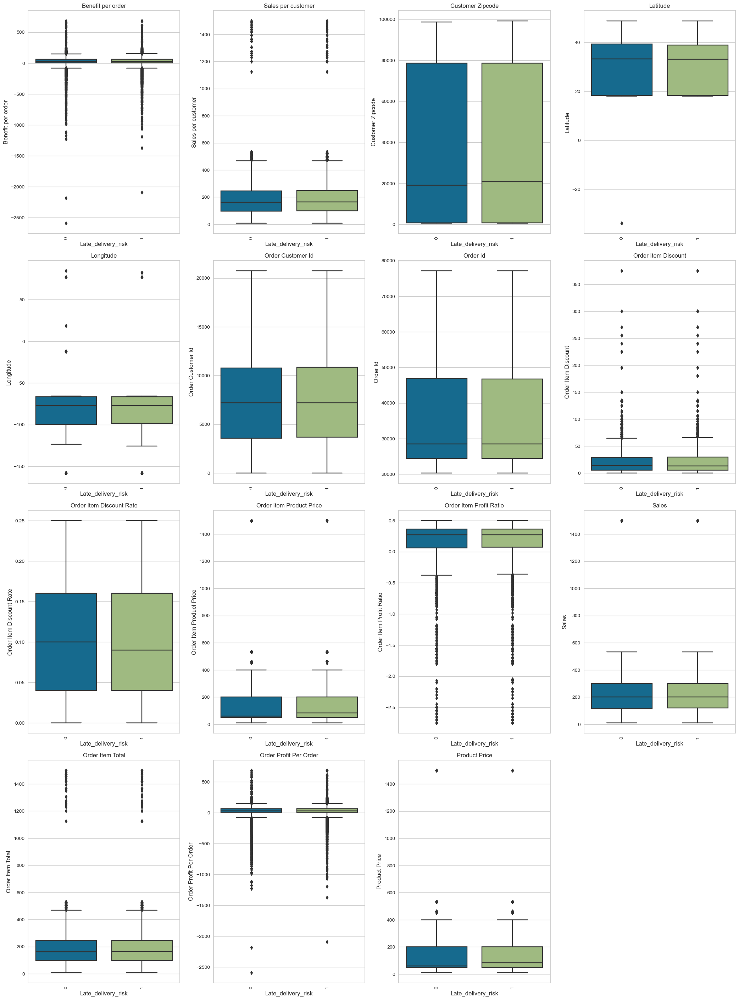

In [36]:
#  cat vs num

t=1
plt.figure(figsize=(21,35))
for i in df_num:
    plt.subplot(5,4,t)
    sns.boxplot(data=df,y=df.loc[:,i],x=df['Late_delivery_risk'])
    plt.title(i)
    t+=1
    plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

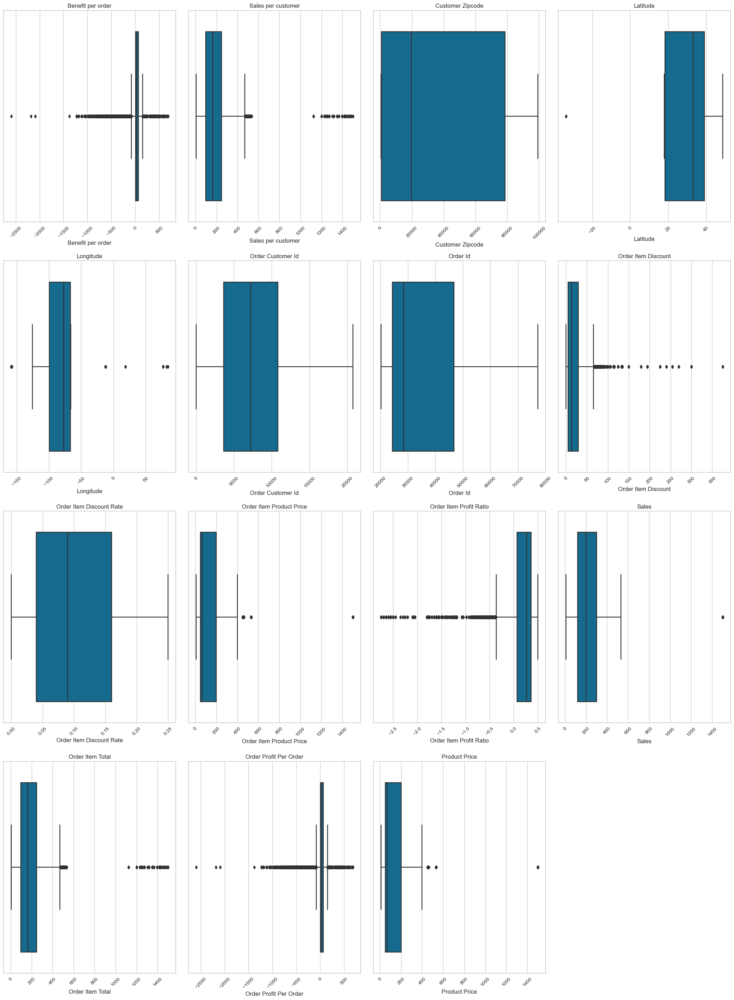

In [37]:
 # checking outliers 
t=1
plt.figure(figsize=(21,35))
for i in df_num:
    plt.subplot(5,4,t)
    sns.boxplot(x=df[i],orient="h")
    plt.title(i)
    t+=1
    plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

* Except latitude,customer zipcode,orderitem discount rate,order id ,order customer id all other other numerical features contain the outliers

In [38]:
# checking the  Missing Values
df.isnull().sum()

Type                                 0
Days for shipping (real)             0
Days for shipment (scheduled)        0
Benefit per order                    0
Sales per customer                   0
Delivery Status                      0
Late_delivery_risk                   0
Category Id                          0
Category Name                        0
Customer City                        0
Customer Country                     0
Customer Email                       0
Customer Fname                       0
Customer Id                          0
Customer Lname                       5
Customer Password                    0
Customer Segment                     0
Customer State                       0
Customer Street                      0
Customer Zipcode                     1
Department Id                        0
Department Name                      0
Latitude                             0
Longitude                            0
Market                               0
Order City               

### columns which have missing values are :-
* Order Zipcode,Product Description,Customer Lname,Customer Zipcode

###  percentage of missing values in the dataframe

In [39]:
((df.isnull().sum()/df.index.size)*100).sort_values(ascending=False)

Order Zipcode                    100.000000
Product Description              100.000000
Customer Lname                     0.016071
Customer Zipcode                   0.003214
Order Item Discount Rate           0.000000
Order Item Id                      0.000000
Order Item Product Price           0.000000
Order Item Profit Ratio            0.000000
Order Item Quantity                0.000000
Sales                              0.000000
Order Item Total                   0.000000
Order Profit Per Order             0.000000
Order Region                       0.000000
Order State                        0.000000
Order Status                       0.000000
Type                               0.000000
Order Item Cardprod Id             0.000000
Product Card Id                    0.000000
Product Category Id                0.000000
Product Image                      0.000000
Product Name                       0.000000
Product Price                      0.000000
Product Status                  

In [40]:
df

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Id,Category Name,Customer City,Customer Country,Customer Email,Customer Fname,Customer Id,Customer Lname,Customer Password,Customer Segment,Customer State,Customer Street,Customer Zipcode,Department Id,Department Name,Latitude,Longitude,Market,...,Order Item Discount Rate,Order Item Id,Order Item Product Price,Order Item Profit Ratio,Order Item Quantity,Sales,Order Item Total,Order Profit Per Order,Order Region,Order State,Order Status,Order Zipcode,Product Card Id,Product Category Id,Product Description,Product Image,Product Name,Product Price,Product Status,shipping date (DateOrders),Shipping Mode,year,month,day,time
0,DEBIT,3,4,91.250000,314.640015,Advance shipping,0,73,Sporting Goods,Caguas,Puerto Rico,XXXXXXXXX,Cally,20755,Holloway,XXXXXXXXX,Consumer,PR,5365 Noble Nectar Island,725.0,2,Fitness,18.251453,-66.037056,Pacific Asia,...,0.04,180517,327.750000,0.29,1,327.750000,314.640015,91.250000,Southeast Asia,Java Occidental,COMPLETE,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.750000,0,2018-03-02 22:56:00,Standard Class,2018,1,31,22:56:00
1,TRANSFER,5,4,-249.089996,311.359985,Late delivery,1,73,Sporting Goods,Caguas,Puerto Rico,XXXXXXXXX,Irene,19492,Luna,XXXXXXXXX,Consumer,PR,2679 Rustic Loop,725.0,2,Fitness,18.279451,-66.037064,Pacific Asia,...,0.05,179254,327.750000,-0.80,1,327.750000,311.359985,-249.089996,South Asia,Rajastán,PENDING,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.750000,0,1/18/2018 12:27,Standard Class,2018,1,13,12:27:00
2,CASH,4,4,-247.779999,309.720001,Shipping on time,0,73,Sporting Goods,San Jose,EE. UU.,XXXXXXXXX,Gillian,19491,Maldonado,XXXXXXXXX,Consumer,CA,8510 Round Bear Gate,95125.0,2,Fitness,37.292233,-121.881279,Pacific Asia,...,0.06,179253,327.750000,-0.80,1,327.750000,309.720001,-247.779999,South Asia,Rajastán,CLOSED,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.750000,0,1/17/2018 12:06,Standard Class,2018,1,13,12:06:00
3,DEBIT,2,1,95.180000,288.420013,Late delivery,1,73,Sporting Goods,Caguas,Puerto Rico,XXXXXXXXX,Constance,19487,Terrell,XXXXXXXXX,Home Office,PR,1879 Green Pine Bank,725.0,2,Fitness,18.242538,-66.037056,Pacific Asia,...,0.12,179249,327.750000,0.33,1,327.750000,288.420013,95.180000,Eastern Asia,Guangdong,COMPLETE,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.750000,0,1/15/2018 10:42,First Class,2018,1,13,10:42:00
4,TRANSFER,2,1,68.430000,285.140015,Late delivery,1,73,Sporting Goods,Miami,EE. UU.,XXXXXXXXX,Erica,19486,Stevens,XXXXXXXXX,Corporate,FL,7595 Cotton Log Row,33162.0,2,Fitness,25.928869,-80.162872,Pacific Asia,...,0.13,179248,327.750000,0.24,1,327.750000,285.140015,68.430000,Eastern Asia,Guangdong,PROCESSING,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.750000,0,1/15/2018 10:21,First Class,2018,1,13,10:21:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31107,DEBIT,6,4,86.400002,319.980011,Late delivery,1,45,Fishing,Caguas,Puerto Rico,XXXXXXXXX,Mary,7396,Madden,XXXXXXXXX,Home Office,PR,9918 Lazy Cape,725.0,7,Fan Shop,18.245256,-66.370621,Pacific Asia,...,0.20,65194,399.980011,0.27,1,399.980011,319.980011,86.400002,Eastern Asia,Sichuan,COMPLETE,NaN,1004,45,NaN,http://images.acmesports.sports/Field+%26+Stre...,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,0,1/22/2016 6:07,Standard Class,2016,1,16,06:07:00
31108,PAYMENT,3,4,119.989998,299.989990,Advance shipping,0,45,Fishing,Lancaster,EE. UU.,XXXXXXXXX,Mary,3080,Smith,XXXXXXXXX,Home Office,OH,8600 Red Goose Abbey,43130.0,7,Fan Shop,39.715977,-82.599297,Pacific Asia,...,0.25,65185,399.980011,0.40,1,399.980011,299.989990,119.989998,Eastern Asia,Shanghái,PENDING_PAYMENT,NaN

<Axes: >

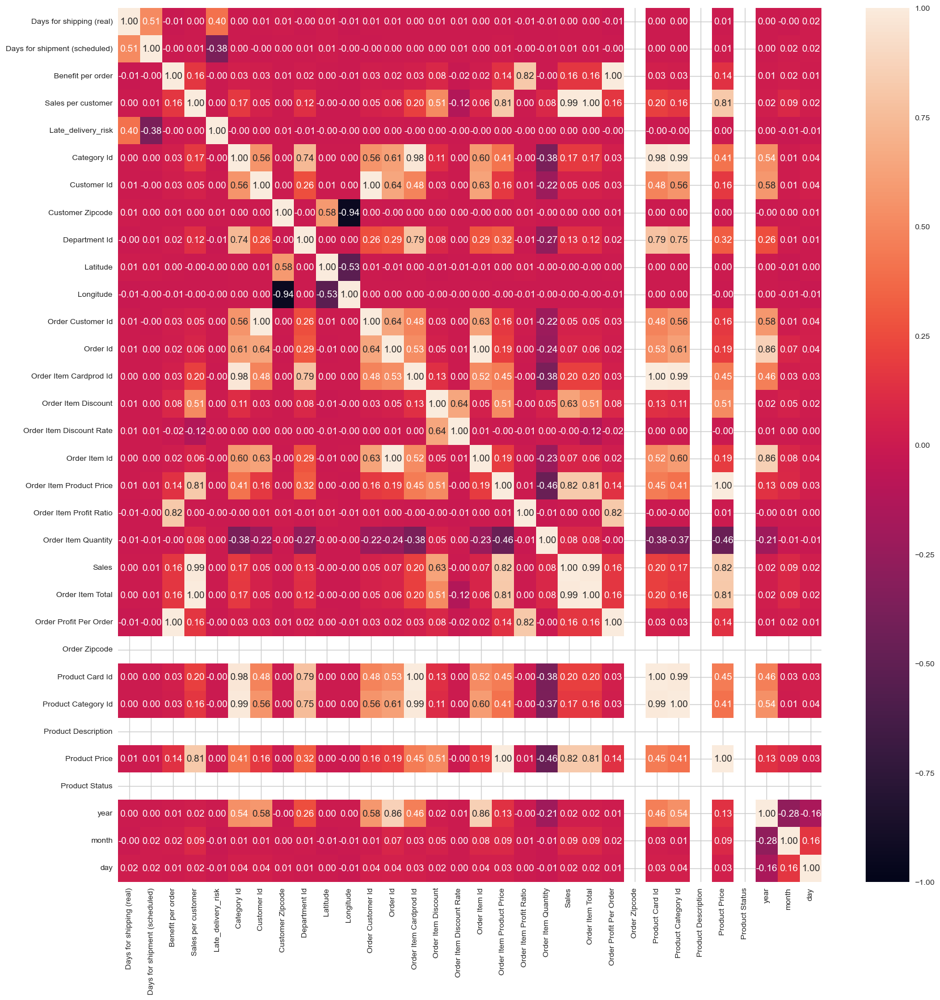

In [41]:
# checking the correlation of the dataframe

plt.figure(figsize=(20,20))
sns.heatmap(df.corr(), annot =True, vmin = -1, vmax = 1, fmt = '.2f')

* product description and order zipcode has no relation because it is empty
* product status also has no relation with the dataframe because of having the same 
* type of the data  which is 0, so there is no point in calculating the it.


In [42]:
df["Product Status"].value_counts()

0    31112
Name: Product Status, dtype: int64

In [43]:
df.groupby("Delivery Status")["Days for shipping (real)"].describe()

,count,mean,std,min,25%,50%,75%,max
Delivery Status,,,,,,,,
Advance shipping,7149.0,2.482585,0.499732,2.0,2.0,2.0,3.0,3.0
Late delivery,17230.0,4.086941,1.701296,1.0,2.0,5.0,6.0,6.0
Shipping canceled,1260.0,3.515873,1.603878,0.0,2.0,3.0,5.0,6.0
Shipping on time,5473.0,2.988124,1.481873,0.0,2.0,4.0,4.0,4.0


In [44]:
df.groupby("Delivery Status")["Late_delivery_risk"].value_counts()

Delivery Status    Late_delivery_risk
Advance shipping   0                      7149
Late delivery      1                     17230
Shipping canceled  0                      1260
Shipping on time   0                      5473
Name: Late_delivery_risk, dtype: int64

In [45]:
df.groupby("Late_delivery_risk")["Delivery Status"].describe()

,count,unique,top,freq
Late_delivery_risk,,,,
0,13882,3,Advance shipping,7149
1,17230,1,Late delivery,17230


In [46]:
df.groupby("Late_delivery_risk")["Days for shipment (scheduled)"].value_counts()

Late_delivery_risk  Days for shipment (scheduled)
0                   4                                11414
                    2                                 1381
                    0                                  873
                    1                                  214
1                   4                                 7072
                    2                                 4731
                    1                                 4721
                    0                                  706
Name: Days for shipment (scheduled), dtype: int64

<Axes: ylabel='Late_delivery_risk,Days for shipment (scheduled)'>

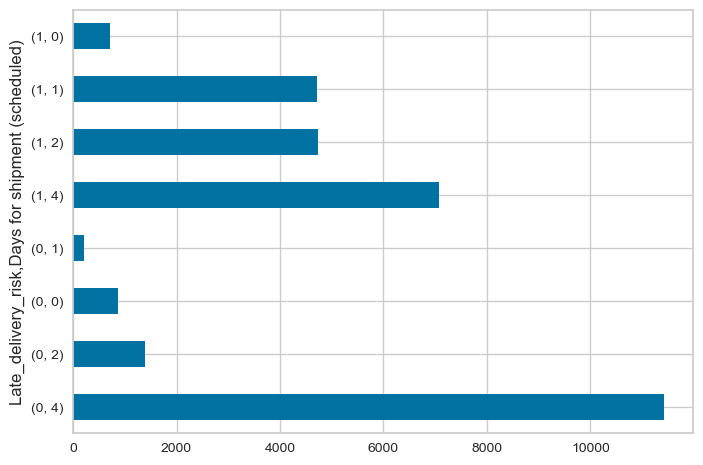

In [47]:
df.groupby("Late_delivery_risk")["Days for shipment (scheduled)"].value_counts().plot(kind="barh")

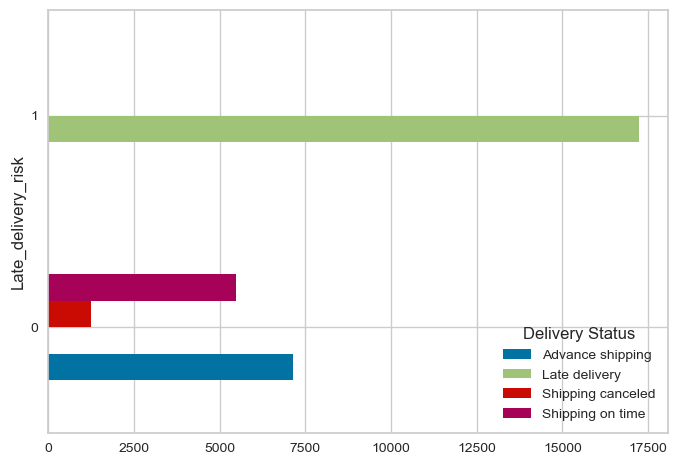

In [48]:
pd.crosstab(columns=df["Delivery Status"],index=df["Late_delivery_risk"]).plot(kind="barh")
plt.show()

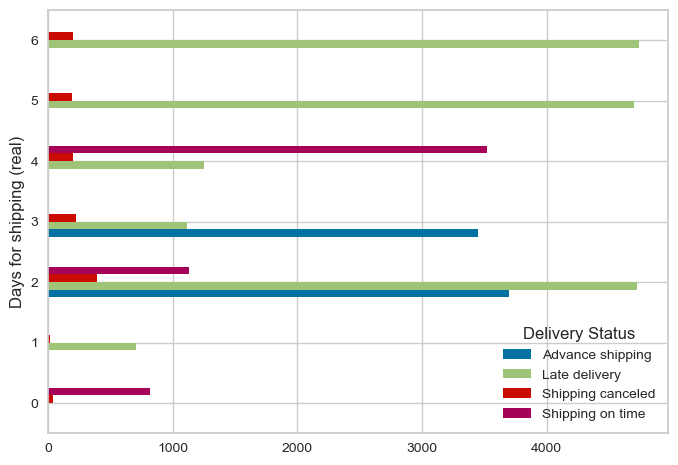

In [49]:
pd.crosstab(index=df["Days for shipping (real)"],columns=df["Delivery Status"]).plot(kind="barh")
plt.show()

* Days 6, 5 and 2 has more late delivery

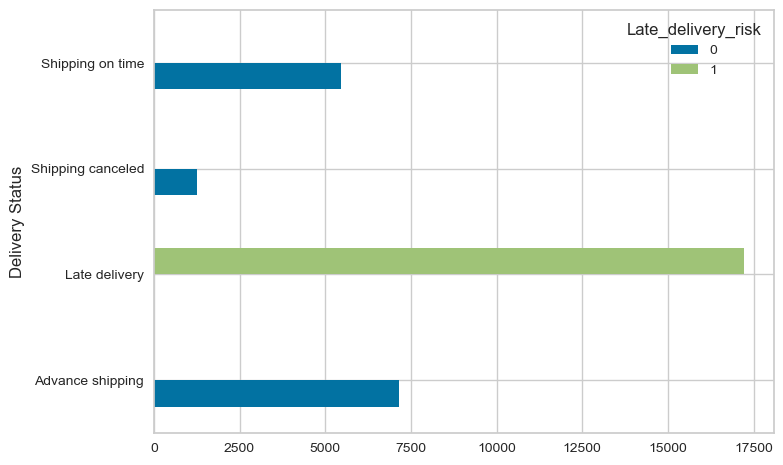

In [50]:
pd.crosstab(index=df["Delivery Status"],columns=df["Late_delivery_risk"]).plot(kind="barh")
plt.show()

* count of late delivery risk is 17.23k
* count of advance shipping is 7149
* count of shipping on time is 5473
* count of shipping cancelled is 1260

In [51]:
px.histogram(df,color="Late_delivery_risk",x="Delivery Status")

In [52]:
px.histogram(df,x="Late_delivery_risk",color="Delivery Status")

In [53]:
df

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Id,Category Name,Customer City,Customer Country,Customer Email,Customer Fname,Customer Id,Customer Lname,Customer Password,Customer Segment,Customer State,Customer Street,Customer Zipcode,Department Id,Department Name,Latitude,Longitude,Market,...,Order Item Discount Rate,Order Item Id,Order Item Product Price,Order Item Profit Ratio,Order Item Quantity,Sales,Order Item Total,Order Profit Per Order,Order Region,Order State,Order Status,Order Zipcode,Product Card Id,Product Category Id,Product Description,Product Image,Product Name,Product Price,Product Status,shipping date (DateOrders),Shipping Mode,year,month,day,time
0,DEBIT,3,4,91.250000,314.640015,Advance shipping,0,73,Sporting Goods,Caguas,Puerto Rico,XXXXXXXXX,Cally,20755,Holloway,XXXXXXXXX,Consumer,PR,5365 Noble Nectar Island,725.0,2,Fitness,18.251453,-66.037056,Pacific Asia,...,0.04,180517,327.750000,0.29,1,327.750000,314.640015,91.250000,Southeast Asia,Java Occidental,COMPLETE,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.750000,0,2018-03-02 22:56:00,Standard Class,2018,1,31,22:56:00
1,TRANSFER,5,4,-249.089996,311.359985,Late delivery,1,73,Sporting Goods,Caguas,Puerto Rico,XXXXXXXXX,Irene,19492,Luna,XXXXXXXXX,Consumer,PR,2679 Rustic Loop,725.0,2,Fitness,18.279451,-66.037064,Pacific Asia,...,0.05,179254,327.750000,-0.80,1,327.750000,311.359985,-249.089996,South Asia,Rajastán,PENDING,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.750000,0,1/18/2018 12:27,Standard Class,2018,1,13,12:27:00
2,CASH,4,4,-247.779999,309.720001,Shipping on time,0,73,Sporting Goods,San Jose,EE. UU.,XXXXXXXXX,Gillian,19491,Maldonado,XXXXXXXXX,Consumer,CA,8510 Round Bear Gate,95125.0,2,Fitness,37.292233,-121.881279,Pacific Asia,...,0.06,179253,327.750000,-0.80,1,327.750000,309.720001,-247.779999,South Asia,Rajastán,CLOSED,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.750000,0,1/17/2018 12:06,Standard Class,2018,1,13,12:06:00
3,DEBIT,2,1,95.180000,288.420013,Late delivery,1,73,Sporting Goods,Caguas,Puerto Rico,XXXXXXXXX,Constance,19487,Terrell,XXXXXXXXX,Home Office,PR,1879 Green Pine Bank,725.0,2,Fitness,18.242538,-66.037056,Pacific Asia,...,0.12,179249,327.750000,0.33,1,327.750000,288.420013,95.180000,Eastern Asia,Guangdong,COMPLETE,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.750000,0,1/15/2018 10:42,First Class,2018,1,13,10:42:00
4,TRANSFER,2,1,68.430000,285.140015,Late delivery,1,73,Sporting Goods,Miami,EE. UU.,XXXXXXXXX,Erica,19486,Stevens,XXXXXXXXX,Corporate,FL,7595 Cotton Log Row,33162.0,2,Fitness,25.928869,-80.162872,Pacific Asia,...,0.13,179248,327.750000,0.24,1,327.750000,285.140015,68.430000,Eastern Asia,Guangdong,PROCESSING,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.750000,0,1/15/2018 10:21,First Class,2018,1,13,10:21:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31107,DEBIT,6,4,86.400002,319.980011,Late delivery,1,45,Fishing,Caguas,Puerto Rico,XXXXXXXXX,Mary,7396,Madden,XXXXXXXXX,Home Office,PR,9918 Lazy Cape,725.0,7,Fan Shop,18.245256,-66.370621,Pacific Asia,...,0.20,65194,399.980011,0.27,1,399.980011,319.980011,86.400002,Eastern Asia,Sichuan,COMPLETE,NaN,1004,45,NaN,http://images.acmesports.sports/Field+%26+Stre...,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,0,1/22/2016 6:07,Standard Class,2016,1,16,06:07:00
31108,PAYMENT,3,4,119.989998,299.989990,Advance shipping,0,45,Fishing,Lancaster,EE. UU.,XXXXXXXXX,Mary,3080,Smith,XXXXXXXXX,Home Office,OH,8600 Red Goose Abbey,43130.0,7,Fan Shop,39.715977,-82.599297,Pacific Asia,...,0.25,65185,399.980011,0.40,1,399.980011,299.989990,119.989998,Eastern Asia,Shanghái,PENDING_PAYMENT,NaN

In [54]:
px.histogram(df,x="Category Name",color="Delivery Status")

In [55]:
px.histogram(df,x="Product Name",color="Delivery Status")

In [56]:
df.corr().T

,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Late_delivery_risk,Category Id,Customer Id,Customer Zipcode,Department Id,Latitude,Longitude,Order Customer Id,Order Id,Order Item Cardprod Id,Order Item Discount,Order Item Discount Rate,Order Item Id,Order Item Product Price,Order Item Profit Ratio,Order Item Quantity,Sales,Order Item Total,Order Profit Per Order,Order Zipcode,Product Card Id,Product Category Id,Product Description,Product Price,Product Status,year,month,day
Days for shipping (real),1.000000,0.508202,-0.008363,0.003209,0.402292,0.002246,0.006645,0.011325,-0.000926,0.011209,-0.009689,0.006645,0.005030,0.001418,0.005145,0.006237,0.004741,0.005967,-0.006825,-0.005435,0.003742,0.003209,-0.008363,NaN,0.001418,0.002878,NaN,0.005967,NaN,0.004589,-0.002296,0.018505
Days for shipment (scheduled),0.508202,1.000000,-0.001759,0.005606,-0.376757,0.004106,-0.000352,0.001965,0.007679,0.011552,-0.002203,-0.000352,0.002683,0.003985,0.001140,0.006162,0.002627,0.008554,-0.001712,-0.006057,0.005271,0.005606,-0.001759,NaN,0.003985,0.004372,NaN,0.008554,NaN,0.000217,0.018224,0.022230
Benefit per order,-0.008363,-0.001759,1.000000,0.158072,-0.000787,0.031807,0.025155,0.005324,0.021770,0.004595,-0.005079,0.025155,0.023092,0.034768,0.083020,-0.022458,0.023173,0.140560,0.818974,-0.002546,0.156850,0.158072,1.000000,NaN,0.034768,0.031079,NaN,0.140560,NaN,0.008793,0.023885,0.008515
Sales per customer,0.003209,0.005606,0.158072,1.000000,0.003592,0.170004,0.048153,0.001009,0.124765,-0.000512,-0.001288,0.048153,0.063927,0.196064,0.513523,-0.119186,0.064942,0.813306,0.000892,0.082110,0.990382,1.000000,0.158072,NaN,0.196064,0.163136,NaN,0.813306,NaN,0.023456,0.087089,0.024611
Late_delivery_risk,0.402292,-0.376757,-0.000787,0.003592,1.000000,-0.004720,0.003959,0.006414,-0.008580,-0.001411,-0.003884,0.003959,0.000025,-0.004653,0.002514,-0.001678,-0.000212,0.001082,-0.001071,0.004353,0.003665,0.003592,-0.000787,NaN,-0.004653,-0.003590,NaN,0.001082,NaN,0.001692,-0.007853,-0.006367
Category Id,0.002246,0.004106,0.031807,0.170004,-0.004720,1.000000,0.559339,0.000440,0.740507,0.002874,0.001633,0.559339,0.614634,0.975412,0.109681,0.004107,0.599364,0.412969,-0.002561,-0.378261,0.171976,0.170004,0.031807,NaN,0.975412,0.990200,NaN,0.412969,NaN,0.543588,0.013446,0.035839
Customer Id,0.006645,-0.000352,0.025155,0.048153,0.003959,0.559339,1.000000,0.002768,0.261602,0.006766,0.001554,1.000000,0.644078,0.481973,0.028903,0.000575,0.626726,0.164396,0.009756,-0.222307,0.048362,0.048153,0.025155,NaN,0.481973,0.559359,NaN,0.164396,NaN,0.577320,0.010605,0.036315
Customer Zipcode,0.011325,0.001965,0.005324,0.001009,0.006414,0.000440,0.002768,1.000000,-0.001058,0.581677,-0.937981,0.002768,-0.001738,0.001593,0.002294,0.003264,-0.001929,0.001535,0.009430,-0.000827,0.001285,0.001009,0.005324,NaN,0.001593,0.001502,NaN,0.001535,NaN,-0.000436,0.002158,0.008763
Department Id,-0.000926,0.007679,0.021770,0.124765,-0.008580,0.740507,0.261602,-0.001058,1.000000,0.001135,0.001657,0.261602,0.293360,0.788519,0.079814,0.001020,0.287438,0.319498,-0.007305,-0.274140,0.126103,0.124765,0.021770,NaN,0.788519,0.750281,NaN,0.319498,NaN,0.259735,0.012255,0.005571
Latitude,0.011209,0.011552,0.004595,-0.000512,-0.001411,0.002874,0.006766,0.581677,0.001135,1.000000,-0.526136,0.006766,-0.005807,0.003998,-0.009355,-0.007642,-0.006317,0.000824,0.008054,-0.002299,-0.001973,-0.000512,0.004595,NaN,0.003998,0.004108,NaN,0.000824,NaN,0.001492,-0.009972,0.004591


<Axes: >

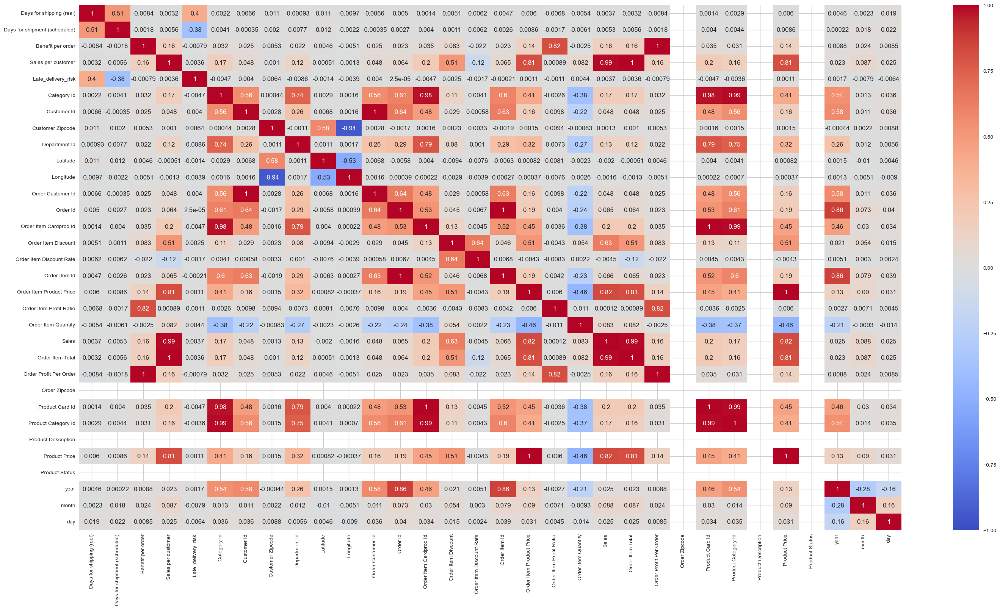

In [57]:
plt.figure(figsize=(35,18))
sns.heatmap(df.corr(),annot=True,vmax=1,vmin=-1,cmap="coolwarm")

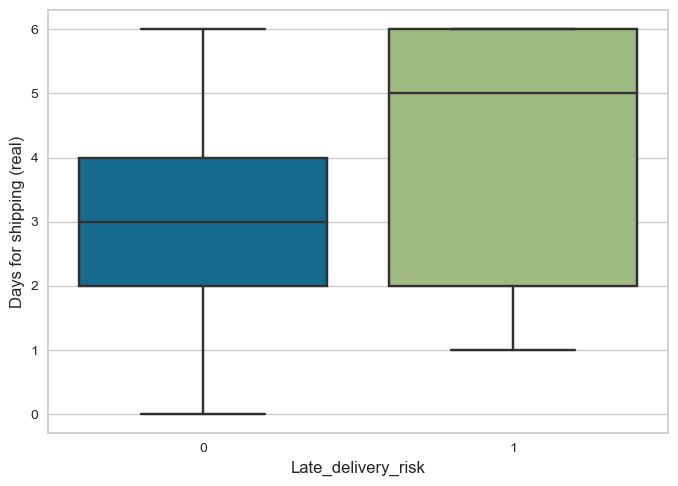

In [58]:
sns.boxplot(data=df, y=df["Days for shipping (real)"], x=df["Late_delivery_risk"])
plt.show()

In [59]:
pd.crosstab(values=df["Benefit per order"],
           columns=df["Category Name"],
           index=df["Shipping Mode"],
           aggfunc=np.mean)

Category Name,Accessories,Baby,Baseball & Softball,Books,Boxing & MMA,CDs,Cameras,Camping & Hiking,Cardio Equipment,Children's Clothing,Cleats,Computers,Consumer Electronics,Crafts,DVDs,Electronics,Fishing,Fitness Accessories,Garden,Girls' Apparel,Golf Apparel,Golf Balls,Golf Gloves,Golf Shoes,Health and Beauty,Hockey,Hunting & Shooting,Indoor/Outdoor Games,Lacrosse,Men's Clothing,Men's Footwear,Music,Pet Supplies,Shop By Sport,Sporting Goods,Tennis & Racquet,Toys,Trade-In,Video Games,Water Sports,Women's Apparel,Women's Clothing
Shipping Mode,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
First Class,12.798689,13.47125,-4.678462,4.505000,23.323334,1.534000,80.640000,28.414250,27.968711,48.163332,26.031610,370.575000,34.305000,63.492000,22.590500,1.250000,35.999843,40.298889,126.381539,31.209737,14.790000,6.793137,10.446667,-32.806666,19.888572,13.710476,13.011429,11.951601,16.382500,-5.295001,11.724150,43.344118,11.163818,8.870822,43.318270,25.714167,1.956909,4.373333,4.129867,21.442939,16.800779,34.118806
Same Day,-2.587058,13.20125,71.224998,2.513636,51.605001,4.118333,NaN,43.980102,37.523404,121.067999,16.204375,585.225006,38.711665,119.445000,49.041429,24.807307,51.696417,12.556667,71.467082,-13.345556,6.800000,11.063333,15.658334,-24.673332,57.912002,18.682000,-17.006668,17.754226,19.343334,41.890909,4.287222,65.775556,11.103636,5.888488,92.105384,-12.413335,0.387222,4.196364,6.860000,27.911466,17.088538,31.348461
Second Class,7.796296,5.69421,11.146250,2.351111,26.626667,0.781000,78.775002,33.995424,13.163900,37.595454,17.724789,231.782105,41.524210,53.194681,21.977407,19.618760,39.803971,-0.109000,77.339524,24.513243,-4.967143,6.575472,-5.871471,36.637857,37.403454,0.386957,7.758000,9.211552,19.681250,-1.230417,11.273183,19.671250,13.121648,15.491506,3.515210,29.176923,2.362222,3.470312,1.576923,12.861210,16.872807,22.292201
Standard Class,3.925135,2.96125,14.900556,-5.276829,17.191316,1.740847,95.318331,33.494017,32.505470,48.176190,18.786683,227.372591,24.079385,47.398380,16.553413,14.372033,39.725072,16.120244,56.397744,14.219467,3.962571,3.244268,-0.500268,9.788929,33.313151,8.772542,7.755143,17.076443,7.730800,-6.716747,15.390223,28.774010,1.701955,10.655069,40.563742,-8.609429,1.513574,6.358220,2.794712,19.420891,14.097694,33.031926


In [60]:
pd.crosstab(values=df["Benefit per order"],
           columns=df["Order Country"],
           index=df["Shipping Mode"],
           aggfunc=np.mean)

Order Country,Afganistán,Arabia Saudí,Armenia,Azerbaiyán,Bangladés,Baréin,Bután,Camboya,China,Corea del Sur,Emiratos Árabes Unidos,Filipinas,Georgia,Hong Kong,India,Indonesia,Irak,Irán,Israel,Japón,Jordania,Kazajistán,Kirguistán,Kuwait,Laos,Líbano,Malasia,Mongolia,Myanmar (Birmania),Nepal,Omán,Pakistán,Qatar,Singapur,Siria,Sri Lanka,Tailandia,Taiwán,Tayikistán,Turkmenistán,Turquía,Uzbekistán,Vietnam,Yemen
Shipping Mode,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
First Class,29.817647,20.783577,8.492,-87.258573,22.495747,NaN,NaN,22.392222,28.860329,19.628527,48.547999,19.506431,28.184546,45.144285,21.767902,21.986536,29.067877,15.909578,18.967917,19.424444,-110.873334,-1.627878,24.465001,NaN,NaN,51.359999,12.861712,-23.982500,22.908158,-0.525713,NaN,5.182626,81.339996,45.184848,49.414000,48.513333,14.737189,NaN,NaN,66.912501,23.886788,30.620833,33.400757,-15.783077
Same Day,68.533333,-29.508800,NaN,15.927858,6.663888,NaN,NaN,-26.004286,17.014431,22.025758,-9.302499,37.098101,48.150002,11.078572,27.992281,33.138800,20.158510,38.921228,18.541250,35.935200,NaN,18.040000,37.892667,NaN,NaN,23.231667,30.303863,-46.881666,21.882609,50.482728,NaN,17.721017,27.949999,14.154285,60.753335,NaN,27.439743,204.970001,NaN,NaN,26.598599,48.652501,16.740645,NaN
Second Class,47.380000,5.770753,NaN,-4.778824,29.682435,NaN,NaN,0.215556,14.109256,19.596640,41.774445,23.879951,8.784000,-8.361875,18.578092,22.424433,14.511958,26.841406,33.083019,4.005512,26.473684,18.004666,10.682381,NaN,NaN,54.419998,26.790729,-11.171764,22.923947,-0.765713,NaN,36.650500,40.709999,40.599324,50.712382,NaN,18.293575,57.082001,35.901667,-35.139998,19.371036,46.034348,3.862727,39.014546
Standard Class,-16.758404,16.704375,NaN,35.991333,18.176870,37.555,41.734,31.033659,22.069515,28.459309,22.482727,22.204635,1.316819,1.099069,20.871668,20.220388,18.376112,24.016916,20.509122,17.202028,26.569221,29.403015,38.435834,66.915001,14.015001,41.034000,18.078874,24.544074,20.404559,14.714878,32.085,29.558095,48.384445,17.479442,35.262258,24.107693,30.304447,-81.083479,26.070000,14.384285,20.068313,17.210286,22.785197,23.156667


In [61]:
pd.crosstab(values=df["Order Profit Per Order"],
           columns=df["Order Country"],
           index=df["Product Name"],
           aggfunc="count")

Order Country,Afganistán,Arabia Saudí,Armenia,Azerbaiyán,Bangladés,Baréin,Bután,Camboya,China,Corea del Sur,Emiratos Árabes Unidos,Filipinas,Georgia,Hong Kong,India,Indonesia,Irak,Irán,Israel,Japón,Jordania,Kazajistán,Kirguistán,Kuwait,Laos,Líbano,Malasia,Mongolia,Myanmar (Birmania),Nepal,Omán,Pakistán,Qatar,Singapur,Siria,Sri Lanka,Tailandia,Taiwán,Tayikistán,Turkmenistán,Turquía,Uzbekistán,Vietnam,Yemen
Product Name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Adult dog supplies,2.0,NaN,NaN,NaN,10.0,NaN,NaN,NaN,106.0,9.0,NaN,38.0,NaN,NaN,54.0,67.0,NaN,NaN,NaN,15.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10.0,NaN,NaN,10.0,NaN,16.0,NaN,NaN,9.0,NaN,NaN,NaN,NaN,NaN,1.0,NaN
Baby sweater,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,33.0,1.0,NaN,1.0,NaN,NaN,13.0,27.0,NaN,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,3.0,NaN,2.0,NaN,NaN,5.0,NaN,NaN,NaN,NaN,NaN,2.0,NaN
Bag Boy Beverage Holder,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15.0,NaN,NaN,3.0,NaN,NaN,14.0,6.0,2.0,8.0,1.0,1.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,2.0,NaN,NaN,2.0,NaN,NaN,NaN,4.0,NaN,NaN,NaN
Bridgestone e6 Straight Distance NFL Carolina,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,10.0,NaN,NaN,2.0,NaN,NaN,6.0,8.0,NaN,5.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,6.0,NaN,NaN,NaN
Bridgestone e6 Straight Distance NFL San Dieg,NaN,1.0,NaN,NaN,2.0,NaN,NaN,NaN,11.0,NaN,NaN,3.0,NaN,NaN,11.0,8.0,1.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,2.0,NaN,NaN,2.0,NaN,NaN,NaN,NaN,3.0,NaN,NaN,NaN,7.0,1.0,5.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Web Camera,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
adidas Kids' F5 Messi FG Soccer Cleat,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,13.0,NaN,NaN,3.0,NaN,NaN,10.0,6.0,5.0,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,1.0,NaN,NaN,1.0,NaN,NaN,NaN,5.0,NaN,1.0,NaN
adidas Men's F10 Messi TRX FG Soccer Cleat,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,8.0,NaN,NaN,1.0,NaN,NaN,7.0,8.0,1.0,3.0,NaN,2.0,NaN,NaN,NaN,NaN,NaN,1.0,3.0,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,2.0,NaN,NaN,NaN,4.0,NaN,2.0,NaN


In [62]:
df.groupby("Late_delivery_risk")["Sales"].describe()

,count,mean,std,min,25%,50%,75%,max
Late_delivery_risk,,,,,,,,
0,13882.0,200.557140,137.363851,9.99,113.959999,199.919998,299.950012,1500.0
1,17230.0,201.564441,136.012497,9.99,119.970001,199.919998,299.950012,1500.0


In [63]:
df.head(1)

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Id,Category Name,Customer City,Customer Country,Customer Email,Customer Fname,Customer Id,Customer Lname,Customer Password,Customer Segment,Customer State,Customer Street,Customer Zipcode,Department Id,Department Name,Latitude,Longitude,Market,...,Order Item Discount Rate,Order Item Id,Order Item Product Price,Order Item Profit Ratio,Order Item Quantity,Sales,Order Item Total,Order Profit Per Order,Order Region,Order State,Order Status,Order Zipcode,Product Card Id,Product Category Id,Product Description,Product Image,Product Name,Product Price,Product Status,shipping date (DateOrders),Shipping Mode,year,month,day,time
0,DEBIT,3,4,91.25,314.640015,Advance shipping,0,73,Sporting Goods,Caguas,Puerto Rico,XXXXXXXXX,Cally,20755,Holloway,XXXXXXXXX,Consumer,PR,5365 Noble Nectar Island,725.0,2,Fitness,18.251453,-66.037056,Pacific Asia,...,0.04,180517,327.75,0.29,1,327.75,314.640015,91.25,Southeast Asia,Java Occidental,COMPLETE,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,2018-03-02 22:56:00,Standard Class,2018,1,31,22:56:00


In [64]:
px.histogram(df,x="Delivery Status",color="month")

* 3 months have more late delivery are:
* Late delivery on the month of december is 2958
* january is 2694
* november is 2909

<Axes: xlabel='Late_delivery_risk'>

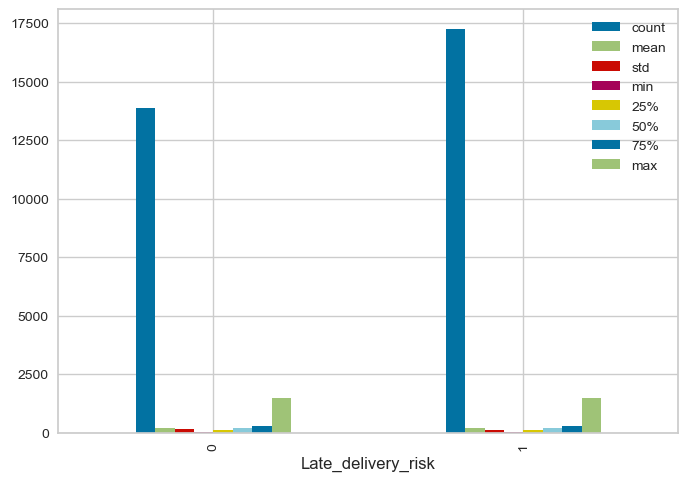

In [65]:
df.groupby("Late_delivery_risk")["Sales"].describe().plot(kind="bar")

In [66]:
df.groupby("Late_delivery_risk")["Benefit per order"].describe()

,count,mean,std,min,25%,50%,75%,max
Late_delivery_risk,,,,,,,,
0,13882.0,21.185153,104.422205,-2592.0,5.2725,28.54,63.357500,680.400024
1,17230.0,21.020495,103.558240,-2092.5,5.5400,29.71,64.007502,684.000000


In [67]:
df.groupby("Late_delivery_risk")["Category Name"].describe()

,count,unique,top,freq
Late_delivery_risk,,,,
0,13882,42,Cleats,1714
1,17230,42,Cleats,2131


In [68]:
df.groupby("Late_delivery_risk")["Shipping Mode"].describe()

,count,unique,top,freq
Late_delivery_risk,,,,
0,13882,4,Standard Class,11414
1,17230,4,Standard Class,7072


In [69]:
df.head(2)

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Id,Category Name,Customer City,Customer Country,Customer Email,Customer Fname,Customer Id,Customer Lname,Customer Password,Customer Segment,Customer State,Customer Street,Customer Zipcode,Department Id,Department Name,Latitude,Longitude,Market,...,Order Item Discount Rate,Order Item Id,Order Item Product Price,Order Item Profit Ratio,Order Item Quantity,Sales,Order Item Total,Order Profit Per Order,Order Region,Order State,Order Status,Order Zipcode,Product Card Id,Product Category Id,Product Description,Product Image,Product Name,Product Price,Product Status,shipping date (DateOrders),Shipping Mode,year,month,day,time
0,DEBIT,3,4,91.250000,314.640015,Advance shipping,0,73,Sporting Goods,Caguas,Puerto Rico,XXXXXXXXX,Cally,20755,Holloway,XXXXXXXXX,Consumer,PR,5365 Noble Nectar Island,725.0,2,Fitness,18.251453,-66.037056,Pacific Asia,...,0.04,180517,327.75,0.29,1,327.75,314.640015,91.250000,Southeast Asia,Java Occidental,COMPLETE,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,2018-03-02 22:56:00,Standard Class,2018,1,31,22:56:00
1,TRANSFER,5,4,-249.089996,311.359985,Late delivery,1,73,Sporting Goods,Caguas,Puerto Rico,XXXXXXXXX,Irene,19492,Luna,XXXXXXXXX,Consumer,PR,2679 Rustic Loop,725.0,2,Fitness,18.279451,-66.037064,Pacific Asia,...,0.05,179254,327.75,-0.80,1,327.75,311.359985,-249.089996,South Asia,Rajastán,PENDING,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/18/2018 12:27,Standard Class,2018,1,13,12:27:00


* year 2016 has the most shipping orders
* we can see the orders are decling the as we move towards the 2018

In [70]:
df.groupby("year")["Order Region"].describe()

,count,unique,top,freq
year,,,,
2015,8963,3,Southeast Asia,3713
2016,16927,5,West Asia,5210
2017,3652,5,Southeast Asia,1099
2018,1570,3,Southeast Asia,650


* year 2016 west asia has the highest count for shipping

In [71]:
df.groupby("year")["Order State"].describe()

,count,unique,top,freq
year,,,,
2015,8963,148,Capital Nacional,747
2016,16927,286,Estambul,876
2017,3652,207,Capital Nacional,241
2018,1570,126,Capital Nacional,87


* year 2016 order state  Estambul has the highest  cout for the shipping

In [72]:
df.groupby("year")["Market"].describe()

,count,unique,top,freq
year,,,,
2015,8963,1,Pacific Asia,8963
2016,16927,1,Pacific Asia,16927
2017,3652,1,Pacific Asia,3652
2018,1570,1,Pacific Asia,1570


In [73]:
pd.crosstab(df["Type"],df["Order Country"])

Order Country,Afganistán,Arabia Saudí,Armenia,Azerbaiyán,Bangladés,Baréin,Bután,Camboya,China,Corea del Sur,Emiratos Árabes Unidos,Filipinas,Georgia,Hong Kong,India,Indonesia,Irak,Irán,Israel,Japón,Jordania,Kazajistán,Kirguistán,Kuwait,Laos,Líbano,Malasia,Mongolia,Myanmar (Birmania),Nepal,Omán,Pakistán,Qatar,Singapur,Siria,Sri Lanka,Tailandia,Taiwán,Tayikistán,Turkmenistán,Turquía,Uzbekistán,Vietnam,Yemen
Type,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
CASH,23,75,0,7,40,0,0,18,657,56,0,234,19,5,540,449,95,115,27,78,6,41,14,0,0,1,56,4,51,6,0,63,8,50,3,4,93,0,0,9,368,18,79,8
DEBIT,37,341,0,22,175,0,0,60,2076,215,10,789,35,16,1844,1577,399,635,104,305,50,97,36,0,2,11,215,8,136,27,8,284,7,173,25,7,337,14,7,21,1272,56,278,22
PAYMENT,58,208,0,24,125,0,0,46,1417,129,4,532,15,30,1095,1001,205,337,68,171,25,57,27,0,0,1,122,34,112,19,0,198,9,128,10,2,213,7,0,9,867,26,166,14
TRANSFER,45,236,5,15,126,4,5,28,1608,183,15,548,24,22,1304,1177,277,373,66,204,27,79,21,2,4,7,151,33,110,28,0,213,18,104,25,3,266,8,0,14,888,21,234,27


In [74]:
pd.crosstab(df["Type"],df["Order Region"])

Order Region,Central Asia,Eastern Asia,South Asia,Southeast Asia,West Asia
Type,,,,,
CASH,82,800,791,1030,617
DEBIT,217,2634,3009,3567,2306
PAYMENT,119,1788,1834,2320,1450
TRANSFER,135,2058,2097,2622,1636


In [75]:
# missing values

In [76]:
((df.isnull().sum()/df.index.size)*100).sort_values(ascending=False)

Order Zipcode                    100.000000
Product Description              100.000000
Customer Lname                     0.016071
Customer Zipcode                   0.003214
Order Item Discount Rate           0.000000
Order Item Id                      0.000000
Order Item Product Price           0.000000
Order Item Profit Ratio            0.000000
Order Item Quantity                0.000000
Sales                              0.000000
Order Item Total                   0.000000
Order Profit Per Order             0.000000
Order Region                       0.000000
Order State                        0.000000
Order Status                       0.000000
Type                               0.000000
Order Item Cardprod Id             0.000000
Product Card Id                    0.000000
Product Category Id                0.000000
Product Image                      0.000000
Product Name                       0.000000
Product Price                      0.000000
Product Status                  

In [77]:
df.isnull().sum()

Type                                 0
Days for shipping (real)             0
Days for shipment (scheduled)        0
Benefit per order                    0
Sales per customer                   0
Delivery Status                      0
Late_delivery_risk                   0
Category Id                          0
Category Name                        0
Customer City                        0
Customer Country                     0
Customer Email                       0
Customer Fname                       0
Customer Id                          0
Customer Lname                       5
Customer Password                    0
Customer Segment                     0
Customer State                       0
Customer Street                      0
Customer Zipcode                     1
Department Id                        0
Department Name                      0
Latitude                             0
Longitude                            0
Market                               0
Order City               

In [78]:
cols=list(df.select_dtypes(include="object").columns)

for i in cols:
    print("\n",df[i].value_counts())


 DEBIT       11733
TRANSFER     8548
PAYMENT      7511
CASH         3320
Name: Type, dtype: int64

 Late delivery        17230
Advance shipping      7149
Shipping on time      5473
Shipping canceled     1260
Name: Delivery Status, dtype: int64

 Cleats                  3845
Men's Footwear          3514
Women's Apparel         3190
Indoor/Outdoor Games    3051
Fishing                 2777
Water Sports            2374
Camping & Hiking        2099
Cardio Equipment        1899
Shop By Sport           1732
Video Games              650
Electronics              614
Women's Clothing         472
Toys                     394
Garden                   365
Pet Supplies             347
Accessories              344
Music                    309
Health and Beauty        286
Golf Balls               286
Sporting Goods           268
Girls' Apparel           234
Crafts                   199
Trade-In                 182
DVDs                     180
Golf Gloves              179
Men's Clothing           150


 11/29/2015 16:21       10
2016-12-02 18:52:00    10
3/16/2016 3:14         10
2016-05-02 15:12:00    10
11/24/2015 3:34        10
                       ..
12/20/2017 18:17        1
12/26/2017 14:25        1
12/29/2017 19:50        1
2018-05-02 19:58:00     1
1/21/2016 5:56          1
Name: shipping date (DateOrders), Length: 12949, dtype: int64

 Standard Class    18486
Second Class       6112
First Class        4935
Same Day           1579
Name: Shipping Mode, dtype: int64

 05:42:00    50
14:48:00    49
07:06:00    48
23:02:00    48
09:22:00    47
            ..
16:38:00     3
05:44:00     3
19:36:00     2
00:50:00     2
12:24:00     1
Name: time, Length: 1440, dtype: int64


In [79]:
cols=list(df.select_dtypes(include="object").columns)

for i in cols:
    print("\n",df[i].nunique)


 <bound method IndexOpsMixin.nunique of 0           DEBIT
1        TRANSFER
2            CASH
3           DEBIT
4        TRANSFER
           ...   
31107       DEBIT
31108     PAYMENT
31109        CASH
31110       DEBIT
31111     PAYMENT
Name: Type, Length: 31112, dtype: object>

 <bound method IndexOpsMixin.nunique of 0        Advance shipping
1           Late delivery
2        Shipping on time
3           Late delivery
4           Late delivery
               ...       
31107       Late delivery
31108    Advance shipping
31109    Shipping on time
31110       Late delivery
31111    Shipping on time
Name: Delivery Status, Length: 31112, dtype: object>

 <bound method IndexOpsMixin.nunique of 0        Sporting Goods
1        Sporting Goods
2        Sporting Goods
3        Sporting Goods
4        Sporting Goods
              ...      
31107           Fishing
31108           Fishing
31109           Fishing
31110           Fishing
31111           Fishing
Name: Category Name, Length: 31112

 <bound method IndexOpsMixin.nunique of 0        22:56:00
1        12:27:00
2        12:06:00
3        10:42:00
4        10:21:00
           ...   
31107    06:07:00
31108    05:04:00
31109    03:40:00
31110    01:34:00
31111    18:54:00
Name: time, Length: 31112, dtype: object>


In [80]:
df[df.columns]


,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Id,Category Name,Customer City,Customer Country,Customer Email,Customer Fname,Customer Id,Customer Lname,Customer Password,Customer Segment,Customer State,Customer Street,Customer Zipcode,Department Id,Department Name,Latitude,Longitude,Market,...,Order Item Discount Rate,Order Item Id,Order Item Product Price,Order Item Profit Ratio,Order Item Quantity,Sales,Order Item Total,Order Profit Per Order,Order Region,Order State,Order Status,Order Zipcode,Product Card Id,Product Category Id,Product Description,Product Image,Product Name,Product Price,Product Status,shipping date (DateOrders),Shipping Mode,year,month,day,time
0,DEBIT,3,4,91.250000,314.640015,Advance shipping,0,73,Sporting Goods,Caguas,Puerto Rico,XXXXXXXXX,Cally,20755,Holloway,XXXXXXXXX,Consumer,PR,5365 Noble Nectar Island,725.0,2,Fitness,18.251453,-66.037056,Pacific Asia,...,0.04,180517,327.750000,0.29,1,327.750000,314.640015,91.250000,Southeast Asia,Java Occidental,COMPLETE,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.750000,0,2018-03-02 22:56:00,Standard Class,2018,1,31,22:56:00
1,TRANSFER,5,4,-249.089996,311.359985,Late delivery,1,73,Sporting Goods,Caguas,Puerto Rico,XXXXXXXXX,Irene,19492,Luna,XXXXXXXXX,Consumer,PR,2679 Rustic Loop,725.0,2,Fitness,18.279451,-66.037064,Pacific Asia,...,0.05,179254,327.750000,-0.80,1,327.750000,311.359985,-249.089996,South Asia,Rajastán,PENDING,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.750000,0,1/18/2018 12:27,Standard Class,2018,1,13,12:27:00
2,CASH,4,4,-247.779999,309.720001,Shipping on time,0,73,Sporting Goods,San Jose,EE. UU.,XXXXXXXXX,Gillian,19491,Maldonado,XXXXXXXXX,Consumer,CA,8510 Round Bear Gate,95125.0,2,Fitness,37.292233,-121.881279,Pacific Asia,...,0.06,179253,327.750000,-0.80,1,327.750000,309.720001,-247.779999,South Asia,Rajastán,CLOSED,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.750000,0,1/17/2018 12:06,Standard Class,2018,1,13,12:06:00
3,DEBIT,2,1,95.180000,288.420013,Late delivery,1,73,Sporting Goods,Caguas,Puerto Rico,XXXXXXXXX,Constance,19487,Terrell,XXXXXXXXX,Home Office,PR,1879 Green Pine Bank,725.0,2,Fitness,18.242538,-66.037056,Pacific Asia,...,0.12,179249,327.750000,0.33,1,327.750000,288.420013,95.180000,Eastern Asia,Guangdong,COMPLETE,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.750000,0,1/15/2018 10:42,First Class,2018,1,13,10:42:00
4,TRANSFER,2,1,68.430000,285.140015,Late delivery,1,73,Sporting Goods,Miami,EE. UU.,XXXXXXXXX,Erica,19486,Stevens,XXXXXXXXX,Corporate,FL,7595 Cotton Log Row,33162.0,2,Fitness,25.928869,-80.162872,Pacific Asia,...,0.13,179248,327.750000,0.24,1,327.750000,285.140015,68.430000,Eastern Asia,Guangdong,PROCESSING,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.750000,0,1/15/2018 10:21,First Class,2018,1,13,10:21:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31107,DEBIT,6,4,86.400002,319.980011,Late delivery,1,45,Fishing,Caguas,Puerto Rico,XXXXXXXXX,Mary,7396,Madden,XXXXXXXXX,Home Office,PR,9918 Lazy Cape,725.0,7,Fan Shop,18.245256,-66.370621,Pacific Asia,...,0.20,65194,399.980011,0.27,1,399.980011,319.980011,86.400002,Eastern Asia,Sichuan,COMPLETE,NaN,1004,45,NaN,http://images.acmesports.sports/Field+%26+Stre...,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,0,1/22/2016 6:07,Standard Class,2016,1,16,06:07:00
31108,PAYMENT,3,4,119.989998,299.989990,Advance shipping,0,45,Fishing,Lancaster,EE. UU.,XXXXXXXXX,Mary,3080,Smith,XXXXXXXXX,Home Office,OH,8600 Red Goose Abbey,43130.0,7,Fan Shop,39.715977,-82.599297,Pacific Asia,...,0.25,65185,399.980011,0.40,1,399.980011,299.989990,119.989998,Eastern Asia,Shanghái,PENDING_PAYMENT,NaN

In [81]:
df.groupby('Category Name')["Category Id"].count()

Category Name
Accessories              344
Baby                      91
Baseball & Softball       93
Books                     69
Boxing & MMA              61
CDs                       90
Cameras                   15
Camping & Hiking        2099
Cardio Equipment        1899
Children's Clothing      110
Cleats                  3845
Computers                 81
Consumer Electronics     108
Crafts                   199
DVDs                     180
Electronics              614
Fishing                 2777
Fitness Accessories       63
Garden                   365
Girls' Apparel           234
Golf Apparel              54
Golf Balls               286
Golf Gloves              179
Golf Shoes                54
Health and Beauty        286
Hockey                   113
Hunting & Shooting        63
Indoor/Outdoor Games    3051
Lacrosse                  44
Men's Clothing           150
Men's Footwear          3514
Music                    309
Pet Supplies             347
Shop By Sport           1732


In [82]:
# delivery status

data_delivery_status=df.groupby(['Delivery Status'])['Order Id'].count().reset_index(name='Number of Orders').sort_values(by= 'Number of Orders', ascending= False)
px.bar(x=data_delivery_status['Delivery Status'] , y=data_delivery_status['Number of Orders']  , color=data_delivery_status['Number of Orders'],
      labels = { 'Delivery Status': 'Delivery Status', 'Number of Orders': 'Number of Orders'})

In [83]:
# delivery region and status
data_delivery_status_region=df.groupby(['Delivery Status', 'Order Region'])['Order Id'].count().reset_index(name='Number of Orders').sort_values(by= 'Number of Orders', ascending= False)
px.bar(data_delivery_status_region, x='Delivery Status', y='Number of Orders'  , color='Order Region',
      )

* here we can see that most late delivery hapoend in southeast asia,then south asia, eastern asia,west asia

In [84]:
# number of orders on customer_id
# top 20 customer which has maximum number of quantiy
df['Customer_ID_STR']=df['Customer Id'].astype(str)

data_customers=df.groupby(['Customer_ID_STR'])['Order Id'].count().reset_index(name='Number of Orders').sort_values(by= 'Number of Orders', ascending= False)
px.bar(data_customers.head(20),x='Number of Orders', y='Customer_ID_STR' , color='Number of Orders'      )

* customer id which has most number of orders are :
* 664 which is more than 21
* 2554 has second higest which 20
* 5583,12038 has 18 which the third higest

In [85]:
# 
# top 20 customer which has maximum order per profit
df['Customer_ID_STR']=df['Customer Id'].astype(str)

data_customers_profit=df.groupby(['Customer_ID_STR'])['Order Profit Per Order'].sum().reset_index(name='Profit of Orders').sort_values(by= 'Profit of Orders', ascending= False)
px.bar(data_customers_profit.head(20),x='Profit of Orders', y='Customer_ID_STR' , color='Profit of Orders'      )

* customer id which has most profit per orders :
* 4781 which is more than 1200
* 7982 has second higest which is more than 1000
* 7331 has less than 1000 and more than 950 which  is the third higest

In [86]:
#Customer Segments
data_Customer_Segment=df.groupby(['Customer Segment'])['Order Id'].count().reset_index(name='Number of Orders').sort_values(by= 'Number of Orders', ascending= False)
px.pie(data_Customer_Segment, values='Number of Orders', names= 'Customer Segment' , title= 'Number of Orders of different Customer Segments', 
       width=600 , height=600 , color_discrete_sequence = px.colors.sequential.RdBu)

* we can that shiiping orders contain Consumer segement  with 51.5%
* then we have Corporate with 30.4%
* and Home office with 18.1%

In [87]:
#Category Name
data_Category_Name=df.groupby(['Category Name'])['Order Id'].count().reset_index(name='Number of Orders').sort_values(by= 'Number of Orders', ascending= True)
px.bar(data_Category_Name, x='Number of Orders',y = 'Category Name',color ='Number of Orders')

* category names which shipped are :

* men footwear more than 3500
* indoor/outdoor games  more 3400
* water sports more than 3100

In [88]:
# orders per region

data_Region=df.groupby(['Order Region'])['Order Id'].count().reset_index(name='Number of Orders').sort_values(by= 'Number of Orders', ascending= True)
px.bar(data_Region, x='Number of Orders',y = 'Order Region',color ='Number of Orders')

#### order region according to number of orders:
* southeast asia has more than 9.5k orders
* south asia has more than 7.5 k oredrs
* eastern asia has more than 7.2k orders

In [89]:
# top countries order in asia

data_countries=df.groupby(['Order Country'])['Order Id'].count().reset_index(name='Number of Orders').sort_values(by= 'Number of Orders', ascending= True)
px.bar(data_countries.head(20), x='Number of Orders',y = 'Order Country',color ='Number of Orders')

In [90]:
df[df['Order Country'] == 'India']

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Id,Category Name,Customer City,Customer Country,Customer Email,Customer Fname,Customer Id,Customer Lname,Customer Password,Customer Segment,Customer State,Customer Street,Customer Zipcode,Department Id,Department Name,Latitude,Longitude,Market,...,Order Item Id,Order Item Product Price,Order Item Profit Ratio,Order Item Quantity,Sales,Order Item Total,Order Profit Per Order,Order Region,Order State,Order Status,Order Zipcode,Product Card Id,Product Category Id,Product Description,Product Image,Product Name,Product Price,Product Status,shipping date (DateOrders),Shipping Mode,year,month,day,time,Customer_ID_STR
1,TRANSFER,5,4,-249.089996,311.359985,Late delivery,1,73,Sporting Goods,Caguas,Puerto Rico,XXXXXXXXX,Irene,19492,Luna,XXXXXXXXX,Consumer,PR,2679 Rustic Loop,725.0,2,Fitness,18.279451,-66.037064,Pacific Asia,...,179254,327.750000,-0.80,1,327.750000,311.359985,-249.089996,South Asia,Rajastán,PENDING,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.750000,0,1/18/2018 12:27,Standard Class,2018,1,13,12:27:00,19492
2,CASH,4,4,-247.779999,309.720001,Shipping on time,0,73,Sporting Goods,San Jose,EE. UU.,XXXXXXXXX,Gillian,19491,Maldonado,XXXXXXXXX,Consumer,CA,8510 Round Bear Gate,95125.0,2,Fitness,37.292233,-121.881279,Pacific Asia,...,179253,327.750000,-0.80,1,327.750000,309.720001,-247.779999,South Asia,Rajastán,CLOSED,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.750000,0,1/17/2018 12:06,Standard Class,2018,1,13,12:06:00,19491
10,DEBIT,2,1,24.580000,245.809998,Late delivery,1,73,Sporting Goods,Caguas,Puerto Rico,XXXXXXXXX,Natalie,19480,Mcfadden,XXXXXXXXX,Corporate,PR,2531 Wishing Square,725.0,2,Fitness,18.278439,-66.037056,Pacific Asia,...,179242,327.750000,0.10,1,327.750000,245.809998,24.580000,South Asia,Maharashtra,COMPLETE,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.750000,0,1/15/2018 8:15,First Class,2018,1,13,08:15:00,19480
11,TRANSFER,2,1,16.389999,327.750000,Late delivery,1,73,Sporting Goods,Peabody,EE. UU.,XXXXXXXXX,Kimberley,19479,Sharpe,XXXXXXXXX,Corporate,MA,6417 Silver Towers,1960.0,2,Fitness,42.526276,-70.927032,Pacific Asia,...,179241,327.750000,0.05,1,327.750000,327.750000,16.389999,South Asia,Maharashtra,PROCESSING,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.750000,0,1/15/2018 7:54,First Class,2018,1,13,07:54:00,19479
12,DEBIT,2,1,-259.579987,324.470001,Late delivery,1,73,Sporting Goods,Caguas,Puerto Rico,XXXXXXXXX,Sade,19478,Lancaster,XXXXXXXXX,Corporate,PR,257 Harvest Close,725.0,2,Fitness,18.284050,-66.037056,Pacific Asia,...,179240,327.750000,-0.80,1,327.750000,324.470001,-259.579987,South Asia,Maharashtra,COMPLETE,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.750000,0,1/15/2018 7:33,First Class,2018,1,13,07:33:00,19478
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31090,PAYMENT,2,4,91.519997,351.980011,Advance shipping,0,45,Fishing,Caguas,Puerto Rico,XXXXXXXXX,Charles,1938,Smith,XXXXXXXXX,Home Office,PR,6314 Honey Canyon,725.0,7,Fan Shop,18.267492,-66.370567,Pacific Asia,...,65414,399.980011,0.26,1,399.980011,351.980011,91.519997,South Asia,Jharkhand,PENDING_PAYMENT,NaN,1004,45,NaN,http://images.acmesports.sports/Field+%26+Stre...,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,0,1/19/2016 10:30,Standard Class,2016,1,17,10:30:00,1938
31092,TRANSFER,4,4,-59.840000,339.980011,Shipping canceled,0,45,Fishing,Madera,EE. UU.,XXXXXXXXX,Mary,6251,Guerra,XXXXXXXXX,Consumer,CA,8289 Stony Thicket,93638.0,7,Fan Shop,36.970711,-120.058853,Pacific Asia,...,65390,399.980011,-0.18,1,399.980011,339.980011,-59.840000,South Asia,Madhya Pradesh,SUSPECTED_FRAUD,NaN,1004,45,N

#### order country according to number of orders:
* country Georgia has most orders which is 93
* country Nepal have orders second highest which is 80
* country Mongolia have third orders third which is 79

In [91]:
df_geo=df.groupby([ 'Order Country', 'Order City'])['Order Profit Per Order'].sum().reset_index(name='Profit of Orders').sort_values(by= 'Profit of Orders', ascending= False)

df_geo

,Order Country,Order City,Profit of Orders
291,Filipinas,Manila,31194.520013
488,Indonesia,Yakarta,26414.899994
676,Tailandia,Bangkok,22552.069923
720,Turquía,Estambul,16557.459957
792,Vietnam,Ho Chi Minh City,12473.060105
...,...,...,...
447,India,Warangal,-1309.019963
678,Taiwán,Taipei,-1374.540018
434,India,Thiruvananthapuram,-1521.400042
54,China,Dalian,-1588.609972


In [92]:
fig = px.choropleth(df_geo ,  locationmode='country names', locations='Order Country',
                    color='Profit of Orders', # lifeExp is a column of data
                    hover_name='Order Country', 
                    #hover_data ='Order City',
                    color_continuous_scale=px.colors.sequential.Plasma)

fig.show()

In [93]:
# sales analysis

In [94]:
# Order Country
df_sales_country=df.groupby([ 'Order Country'])['Sales'].sum().reset_index(name='Sales of Orders').sort_values(by= 'Sales of Orders', ascending= False)
px.bar(df_sales_country.head(10), x='Sales of Orders',y = 'Order Country',color ='Sales of Orders')

In [95]:
#Product
df_sales_country=df.groupby([ 'Product Name'])['Sales'].sum().reset_index(name='Sales of Orders').sort_values(by= 'Sales of Orders', ascending= False)
px.bar(df_sales_country.head(10), x='Sales of Orders',y = 'Product Name',color ='Sales of Orders')

In [96]:
#Product and deliveray status
df_sales_pd=df.groupby([ 'Product Name', 'Delivery Status'])['Sales'].sum().reset_index(name='Sales of Orders').sort_values(by= 'Sales of Orders', ascending= False)
px.bar(df_sales_pd.head(10), x='Sales of Orders',y = 'Product Name',color ='Delivery Status')

In [97]:
#Product and order region
df_sales_pr=df.groupby([ 'Product Name', 'Order Region'])['Sales'].sum().reset_index(name='Sales of Orders').sort_values(by= 'Sales of Orders', ascending= False)
px.bar(df_sales_pr.head(10), x='Sales of Orders',y = 'Product Name',color ='Order Region')

In [98]:
#'Category Name'
df_sales_pr=df.groupby([  'Category Name'])['Sales'].sum().reset_index(name='Sales of Orders').sort_values(by= 'Sales of Orders', ascending= False)
px.bar(df_sales_pr.head(10), x='Sales of Orders',y = 'Category Name',color ='Sales of Orders')

In [99]:
#'Type of payment
df_sales_pr=df.groupby([ 'Type'])['Sales'].sum().reset_index(name='Sales of Orders').sort_values(by= 'Sales of Orders', ascending= False)
px.bar(df_sales_pr.head(10), x='Sales of Orders',y = 'Type',color ='Sales of Orders')

In [100]:
df_sales_tp=df.groupby([ 'Type', 'Product Name'])['Sales'].sum().reset_index(name='Sales of Orders').sort_values(by= 'Sales of Orders', ascending= False)
px.bar(df_sales_tp.head(10), x='Sales of Orders',y = 'Type',color ='Product Name')

In [101]:
import datetime as dt

data_orderdate=df[['order date (DateOrders)', 'Sales']]
data_orderdate['order_date'] = pd.to_datetime(data_orderdate['order date (DateOrders)'])

In [102]:
data_orderdate["Quarter"] = data_orderdate['order_date'].dt.quarter
data_orderdate["Month"] = data_orderdate['order_date'].dt.month
data_orderdate["year"] = data_orderdate['order_date'].dt.year

In [103]:
data_orderdate['YearStr']=data_orderdate['year'].astype(str)
df_sales_year=data_orderdate.groupby([ 'YearStr'])['Sales'].sum().reset_index(name='Sales of Orders').sort_values(by= 'Sales of Orders', ascending= False)
px.bar(df_sales_year, x='Sales of Orders',y = 'YearStr',color ='Sales of Orders')

In [104]:
df.head(3)

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Id,Category Name,Customer City,Customer Country,Customer Email,Customer Fname,Customer Id,Customer Lname,Customer Password,Customer Segment,Customer State,Customer Street,Customer Zipcode,Department Id,Department Name,Latitude,Longitude,Market,...,Order Item Id,Order Item Product Price,Order Item Profit Ratio,Order Item Quantity,Sales,Order Item Total,Order Profit Per Order,Order Region,Order State,Order Status,Order Zipcode,Product Card Id,Product Category Id,Product Description,Product Image,Product Name,Product Price,Product Status,shipping date (DateOrders),Shipping Mode,year,month,day,time,Customer_ID_STR
0,DEBIT,3,4,91.250000,314.640015,Advance shipping,0,73,Sporting Goods,Caguas,Puerto Rico,XXXXXXXXX,Cally,20755,Holloway,XXXXXXXXX,Consumer,PR,5365 Noble Nectar Island,725.0,2,Fitness,18.251453,-66.037056,Pacific Asia,...,180517,327.75,0.29,1,327.75,314.640015,91.250000,Southeast Asia,Java Occidental,COMPLETE,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,2018-03-02 22:56:00,Standard Class,2018,1,31,22:56:00,20755
1,TRANSFER,5,4,-249.089996,311.359985,Late delivery,1,73,Sporting Goods,Caguas,Puerto Rico,XXXXXXXXX,Irene,19492,Luna,XXXXXXXXX,Consumer,PR,2679 Rustic Loop,725.0,2,Fitness,18.279451,-66.037064,Pacific Asia,...,179254,327.75,-0.80,1,327.75,311.359985,-249.089996,South Asia,Rajastán,PENDING,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/18/2018 12:27,Standard Class,2018,1,13,12:27:00,19492
2,CASH,4,4,-247.779999,309.720001,Shipping on time,0,73,Sporting Goods,San Jose,EE. UU.,XXXXXXXXX,Gillian,19491,Maldonado,XXXXXXXXX,Consumer,CA,8510 Round Bear Gate,95125.0,2,Fitness,37.292233,-121.881279,Pacific Asia,...,179253,327.75,-0.80,1,327.75,309.720001,-247.779999,South Asia,Rajastán,CLOSED,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/17/2018 12:06,Standard Class,2018,1,13,12:06:00,19491


In [105]:
df_num

,Benefit per order,Sales per customer,Customer Zipcode,Latitude,Longitude,Order Customer Id,Order Id,Order Item Discount,Order Item Discount Rate,Order Item Product Price,Order Item Profit Ratio,Sales,Order Item Total,Order Profit Per Order,Product Price
0,91.250000,314.640015,725.0,18.251453,-66.037056,20755,77202,13.110000,0.04,327.750000,0.29,327.750000,314.640015,91.250000,327.750000
1,-249.089996,311.359985,725.0,18.279451,-66.037064,19492,75939,16.389999,0.05,327.750000,-0.80,327.750000,311.359985,-249.089996,327.750000
2,-247.779999,309.720001,95125.0,37.292233,-121.881279,19491,75938,18.030001,0.06,327.750000,-0.80,327.750000,309.720001,-247.779999,327.750000
3,95.180000,288.420013,725.0,18.242538,-66.037056,19487,75934,39.330002,0.12,327.750000,0.33,327.750000,288.420013,95.180000,327.750000
4,68.430000,285.140015,33162.0,25.928869,-80.162872,19486,75933,42.610001,0.13,327.750000,0.24,327.750000,285.140015,68.430000,327.750000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31107,86.400002,319.980011,725.0,18.245256,-66.370621,7396,26050,80.000000,0.20,399.980011,0.27,399.980011,319.980011,86.400002,399.980011
31108,119.989998,299.989990,43130.0,39.715977,-82.599297,3080,26047,100.000000,0.25,399.980011,0.40,399.980011,299.989990,119.989998,399.980011
31109,40.000000,399.980011,11207.0,40.640930,-73.942711,1005,26043,0.000000,0.00,399.980011,0.10,399.980011,399.980011,40.000000,399.980011
31110,-613.770019,395.980011,93304.0,35.362545,-119.018700,9141,26037,4.000000,0.01,399.980011,-1.55,399.980011,395.980011,-613.770019,399.980011


### Hypothesis  testing 
* chi2 test

In [106]:
num_cols=df[['Days for shipping (real)', 'Days for shipment (scheduled)',
       'Benefit per order', 'Sales per customer', 'Late_delivery_risk',
       'Category Id', 'Customer Id', 'Customer Zipcode', 'Department Id',
       'Latitude', 'Longitude', 'Order Customer Id', 'Order Id',
       'Order Item Cardprod Id', 'Order Item Discount',
       'Order Item Discount Rate', 'Order Item Id', 'Order Item Product Price',
       'Order Item Profit Ratio', 'Order Item Quantity', 'Sales',
       'Order Item Total', 'Order Profit Per Order', 'Order Zipcode',
       'Product Card Id', 'Product Category Id', 'Product Description',
       'Product Price', 'Product Status', 'year', 'month', 'day']]

In [107]:
cat_columns =df[ ['Type', 'Delivery Status', 'Category Name', 'Customer City',
       'Customer Country', 'Customer Email', 'Customer Fname',
       'Customer Lname', 'Customer Password', 'Customer Segment',
       'Customer State', 'Customer Street', 'Department Name', 'Market',
       'Order City', 'Order Country', 'Order Region', 'Order State',
       'Order Status', 'Product Image', 'Product Name',
       'shipping date (DateOrders)', 'Shipping Mode', 'time',
       'Customer_ID_STR']]

In [108]:
target_column=df["Late_delivery_risk"]

In [109]:
from scipy.stats import chi2_contingency
# Assuming df_cat is your categorical variable and df_target is your target variable
dependent_variables = []
independent_variables = []

for i in df_cat:
    contingency_table = pd.crosstab(df_cat[i],target_column)

# Perform Chi-Square Test of Independence
    chi2, p, dof, expected = chi2_contingency(contingency_table.values)
 # Check if p-value is less than 0.05
    if p < 0.05:
        dependent_variables.append(([i],p))
    else:
        independent_variables.append(([i],p))

# Print the results
print("Dependent Variables:\n", dependent_variables)

print("\nIndependent Variables:", independent_variables)

Dependent Variables:
 [(['Type'], 2.8515222920173814e-47), (['Days for shipping (real)'], 0.0), (['Days for shipment (scheduled)'], 0.0), (['Delivery Status'], 0.0), (['Customer City'], 8.426853746026685e-133), (['Customer Segment'], 0.0025001965674298085), (['Order City'], 4.469997195091588e-205), (['Order Country'], 1.052983434776488e-10), (['Shipping Mode'], 0.0), (['Order Status'], 0.0), (['Order State'], 5.8095425714440206e-92)]

Independent Variables: [(['Category Id'], 0.3620828126669986), (['Customer Country'], 0.3951568637963868), (['Department Id'], 0.5684705376166033), (['Order Item Cardprod Id'], 0.6151087472260199), (['Order Item Quantity'], 0.07568694808996283), (['Order Region'], 0.21155347240996467)]


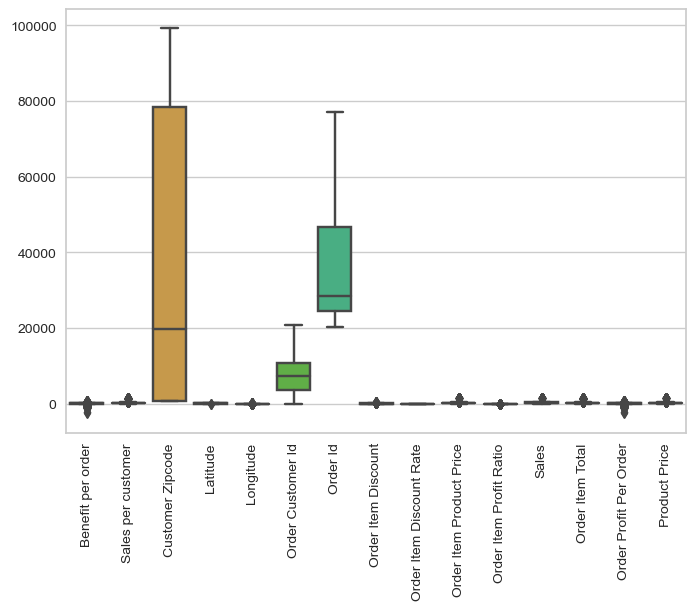

In [110]:
sns.boxplot(df_num)
plt.xticks(rotation=90)
plt.show()

In [111]:
df.shape

(31112, 58)

### outliers removing

In [112]:
q3=df_num.quantile(0.75)
q1=df_num.quantile(0.25)

iqr=q3-q1
upper=q3+1.5*iqr
lower=q1-1.5*iqr
#outliers = df.select_dtypes(include =np.number)[(df.select_dtypes(include =np.number) >= lower) & (df.select_dtypes(include =np.number)<= upper)]
outliers_mask = (df_num < lower) | (df_num > upper)

# Remove rows with outliers
df[~outliers_mask.any(axis=1)]

# Display the resulting DataFrame without outliers
df.head(1)

#from sklearn.impute import KNNImputer

# Example: Use KNN imputation
#imputer = KNNImputer(n_neighbors=5)
#df_no_outliers_filled = pd.DataFrame(imputer.fit_transform(outliers), columns=outliers.columns)

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Id,Category Name,Customer City,Customer Country,Customer Email,Customer Fname,Customer Id,Customer Lname,Customer Password,Customer Segment,Customer State,Customer Street,Customer Zipcode,Department Id,Department Name,Latitude,Longitude,Market,...,Order Item Id,Order Item Product Price,Order Item Profit Ratio,Order Item Quantity,Sales,Order Item Total,Order Profit Per Order,Order Region,Order State,Order Status,Order Zipcode,Product Card Id,Product Category Id,Product Description,Product Image,Product Name,Product Price,Product Status,shipping date (DateOrders),Shipping Mode,year,month,day,time,Customer_ID_STR
0,DEBIT,3,4,91.25,314.640015,Advance shipping,0,73,Sporting Goods,Caguas,Puerto Rico,XXXXXXXXX,Cally,20755,Holloway,XXXXXXXXX,Consumer,PR,5365 Noble Nectar Island,725.0,2,Fitness,18.251453,-66.037056,Pacific Asia,...,180517,327.75,0.29,1,327.75,314.640015,91.25,Southeast Asia,Java Occidental,COMPLETE,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,2018-03-02 22:56:00,Standard Class,2018,1,31,22:56:00,20755


In [113]:
df.isnull().sum()



Type                                 0
Days for shipping (real)             0
Days for shipment (scheduled)        0
Benefit per order                    0
Sales per customer                   0
Delivery Status                      0
Late_delivery_risk                   0
Category Id                          0
Category Name                        0
Customer City                        0
Customer Country                     0
Customer Email                       0
Customer Fname                       0
Customer Id                          0
Customer Lname                       5
Customer Password                    0
Customer Segment                     0
Customer State                       0
Customer Street                      0
Customer Zipcode                     1
Department Id                        0
Department Name                      0
Latitude                             0
Longitude                            0
Market                               0
Order City               

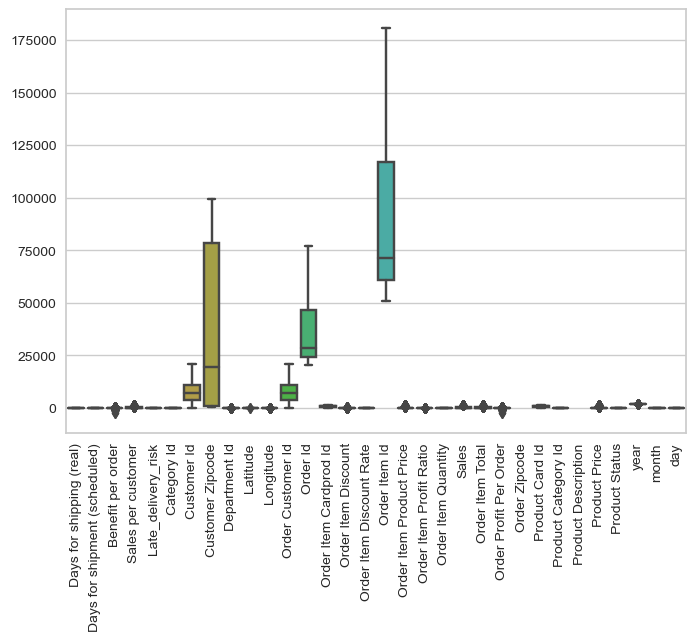

In [114]:
sns.boxplot(df.select_dtypes(include=np.number))
plt.xticks(rotation=90)
plt.show()

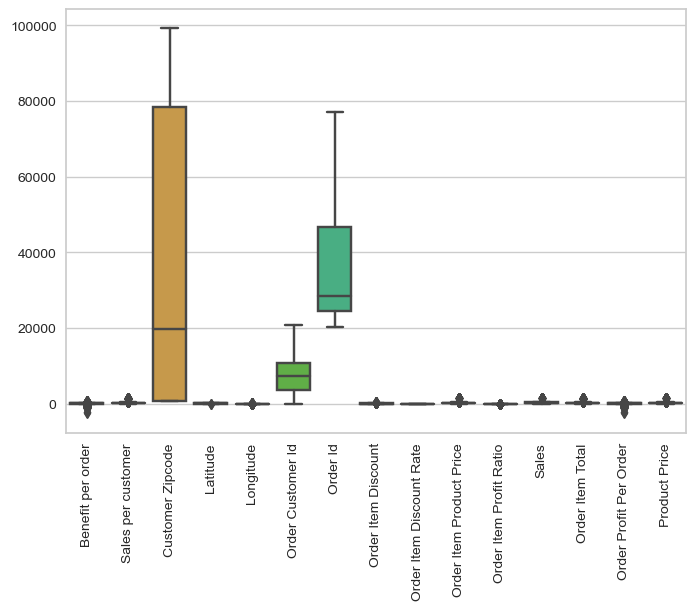

In [115]:
sns.boxplot(df_num)
plt.xticks(rotation=90)
plt.show()

### scale the numerical columns(using standard scaler)

In [116]:
# Scale the data using StandardScaler
scaler = StandardScaler()
for i in df_num:
    df[i] = scaler.fit_transform(df_num)

# Create a new DataFrame with the scaled data
#df_scaled = pd.DataFrame(scaled_data, columns=df_no_outliers_filled.columns)
df

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Id,Category Name,Customer City,Customer Country,Customer Email,Customer Fname,Customer Id,Customer Lname,Customer Password,Customer Segment,Customer State,Customer Street,Customer Zipcode,Department Id,Department Name,Latitude,Longitude,Market,...,Order Item Id,Order Item Product Price,Order Item Profit Ratio,Order Item Quantity,Sales,Order Item Total,Order Profit Per Order,Order Region,Order State,Order Status,Order Zipcode,Product Card Id,Product Category Id,Product Description,Product Image,Product Name,Product Price,Product Status,shipping date (DateOrders),Shipping Mode,year,month,day,time,Customer_ID_STR
0,DEBIT,3,4,0.674958,0.674958,Advance shipping,0,73,Sporting Goods,Caguas,Puerto Rico,XXXXXXXXX,Cally,20755,Holloway,XXXXXXXXX,Consumer,PR,5365 Noble Nectar Island,0.674958,2,Fitness,0.674958,0.674958,Pacific Asia,...,180517,0.674958,0.674958,1,0.674958,0.674958,0.674958,Southeast Asia,Java Occidental,COMPLETE,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,0.674958,0,2018-03-02 22:56:00,Standard Class,2018,1,31,22:56:00,20755
1,TRANSFER,5,4,-2.599390,-2.599390,Late delivery,1,73,Sporting Goods,Caguas,Puerto Rico,XXXXXXXXX,Irene,19492,Luna,XXXXXXXXX,Consumer,PR,2679 Rustic Loop,-2.599390,2,Fitness,-2.599390,-2.599390,Pacific Asia,...,179254,-2.599390,-2.599390,1,-2.599390,-2.599390,-2.599390,South Asia,Rajastán,PENDING,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,-2.599390,0,1/18/2018 12:27,Standard Class,2018,1,13,12:27:00,19492
2,CASH,4,4,-2.586786,-2.586786,Shipping on time,0,73,Sporting Goods,San Jose,EE. UU.,XXXXXXXXX,Gillian,19491,Maldonado,XXXXXXXXX,Consumer,CA,8510 Round Bear Gate,-2.586786,2,Fitness,-2.586786,-2.586786,Pacific Asia,...,179253,-2.586786,-2.586786,1,-2.586786,-2.586786,-2.586786,South Asia,Rajastán,CLOSED,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,-2.586786,0,1/17/2018 12:06,Standard Class,2018,1,13,12:06:00,19491
3,DEBIT,2,1,0.712768,0.712768,Late delivery,1,73,Sporting Goods,Caguas,Puerto Rico,XXXXXXXXX,Constance,19487,Terrell,XXXXXXXXX,Home Office,PR,1879 Green Pine Bank,0.712768,2,Fitness,0.712768,0.712768,Pacific Asia,...,179249,0.712768,0.712768,1,0.712768,0.712768,0.712768,Eastern Asia,Guangdong,COMPLETE,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,0.712768,0,1/15/2018 10:42,First Class,2018,1,13,10:42:00,19487
4,TRANSFER,2,1,0.455411,0.455411,Late delivery,1,73,Sporting Goods,Miami,EE. UU.,XXXXXXXXX,Erica,19486,Stevens,XXXXXXXXX,Corporate,FL,7595 Cotton Log Row,0.455411,2,Fitness,0.455411,0.455411,Pacific Asia,...,179248,0.455411,0.455411,1,0.455411,0.455411,0.455411,Eastern Asia,Guangdong,PROCESSING,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,0.455411,0,1/15/2018 10:21,First Class,2018,1,13,10:21:00,19486
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31107,DEBIT,6,4,0.628297,0.628297,Late delivery,1,45,Fishing,Caguas,Puerto Rico,XXXXXXXXX,Mary,7396,Madden,XXXXXXXXX,Home Office,PR,9918 Lazy Cape,0.628297,7,Fan Shop,0.628297,0.628297,Pacific Asia,...,65194,0.628297,0.628297,1,0.628297,0.628297,0.628297,Eastern Asia,Sichuan,COMPLETE,NaN,1004,45,NaN,http://images.acmesports.sports/Field+%26+Stre...,Field & Stream Sportsman 16 Gun Fire Safe,0.628297,0,1/22/2016 6:07,Standard Class,2016,1,16,06:07:00,7396
31108,PAYMENT,3,4,0.951460,0.951460,Advance shipping,0,45,Fishing,Lancaster,EE. UU.,XXXXXXXXX,Mary,3080,Smith,XXXXXXXXX,Home Office,OH,8600 Red Goose Abbey,0.951460,7,Fan Shop,0.951460,0.951460,Pacific Asia,...,65185,0.951460,0.951460,1,0.951460,0.951460,0.951460,Eastern Asia,Shanghái,PENDING_PAYMENT,NaN,1004,45,NaN,http://images.acmesports.sports/Field+%26+Stre.

In [117]:
df_num.shape


(31112, 15)

### Encoding the categorical columns
* using **Frequency encoding**
* **Label encoding**

In [118]:
df_cat_more = df.select_dtypes(include = object).nunique()[df.select_dtypes(include = object).nunique() > 10].index
df[df_cat_more]

,Category Name,Customer City,Customer Fname,Customer Lname,Customer State,Customer Street,Department Name,Order City,Order Country,Order State,Product Image,Product Name,shipping date (DateOrders),time,Customer_ID_STR
0,Sporting Goods,Caguas,Cally,Holloway,PR,5365 Noble Nectar Island,Fitness,Bekasi,Indonesia,Java Occidental,http://images.acmesports.sports/Smart+watch,Smart watch,2018-03-02 22:56:00,22:56:00,20755
1,Sporting Goods,Caguas,Irene,Luna,PR,2679 Rustic Loop,Fitness,Bikaner,India,Rajastán,http://images.acmesports.sports/Smart+watch,Smart watch,1/18/2018 12:27,12:27:00,19492
2,Sporting Goods,San Jose,Gillian,Maldonado,CA,8510 Round Bear Gate,Fitness,Bikaner,India,Rajastán,http://images.acmesports.sports/Smart+watch,Smart watch,1/17/2018 12:06,12:06:00,19491
3,Sporting Goods,Caguas,Constance,Terrell,PR,1879 Green Pine Bank,Fitness,Guangzhou,China,Guangdong,http://images.acmesports.sports/Smart+watch,Smart watch,1/15/2018 10:42,10:42:00,19487
4,Sporting Goods,Miami,Erica,Stevens,FL,7595 Cotton Log Row,Fitness,Guangzhou,China,Guangdong,http://images.acmesports.sports/Smart+watch,Smart watch,1/15/2018 10:21,10:21:00,19486
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31107,Fishing,Caguas,Mary,Madden,PR,9918 Lazy Cape,Fan Shop,Chengdu,China,Sichuan,http://images.acmesports.sports/Field+%26+Stre...,Field & Stream Sportsman 16 Gun Fire Safe,1/22/2016 6:07,06:07:00,7396
31108,Fishing,Lancaster,Mary,Smith,OH,8600 Red Goose Abbey,Fan Shop,Shanghái,China,Shanghái,http://images.acmesports.sports/Field+%26+Stre...,Field & Stream Sportsman 16 Gun Fire Safe,1/19/2016 5:04,05:04:00,3080
31109,Fishing,Brooklyn,Maria,Peterson,NY,1322 Broad Glade,Fan Shop,Shanghái,China,Shanghái,http://images.acmesports.sports/Field+%26+Stre...,Field & Stream Sportsman 16 Gun Fire Safe,1/20/2016 3:40,03:40:00,1005
31110,Fishing,Bakersfield,Ronald,Clark,CA,7330 Broad Apple Moor,Fan Shop,Hirakata,Japón,Osaka,http://images.acmesports.sports/Field+%26+Stre...,Field & Stream Sportsman 16 Gun Fire Safe,1/19/2016 1:34,01:34:00,9141


In [119]:
df_cat_ten = df.select_dtypes(include = object).nunique()[df.select_dtypes(include = object).nunique() < 10].index
df[df_cat_ten]

,Type,Delivery Status,Customer Country,Customer Email,Customer Password,Customer Segment,Market,Order Region,Order Status,Shipping Mode
0,DEBIT,Advance shipping,Puerto Rico,XXXXXXXXX,XXXXXXXXX,Consumer,Pacific Asia,Southeast Asia,COMPLETE,Standard Class
1,TRANSFER,Late delivery,Puerto Rico,XXXXXXXXX,XXXXXXXXX,Consumer,Pacific Asia,South Asia,PENDING,Standard Class
2,CASH,Shipping on time,EE. UU.,XXXXXXXXX,XXXXXXXXX,Consumer,Pacific Asia,South Asia,CLOSED,Standard Class
3,DEBIT,Late delivery,Puerto Rico,XXXXXXXXX,XXXXXXXXX,Home Office,Pacific Asia,Eastern Asia,COMPLETE,First Class
4,TRANSFER,Late delivery,EE. UU.,XXXXXXXXX,XXXXXXXXX,Corporate,Pacific Asia,Eastern Asia,PROCESSING,First Class
...,...,...,...,...,...,...,...,...,...,...
31107,DEBIT,Late delivery,Puerto Rico,XXXXXXXXX,XXXXXXXXX,Home Office,Pacific Asia,Eastern Asia,COMPLETE,Standard Class
31108,PAYMENT,Advance shipping,EE. UU.,XXXXXXXXX,XXXXXXXXX,Home Office,Pacific Asia,Eastern Asia,PENDING_PAYMENT,Standard Class
31109,CASH,Shipping on time,EE. UU.,XXXXXXXXX,XXXXXXXXX,Home Office,Pacific Asia,Eastern Asia,CLOSED,Standard Class
31110,DEBIT,Late delivery,EE. UU.,XXXXXXXXX,XXXXXXXXX,Corporate,Pacific Asia,Eastern Asia,COMPLETE,Second Class


In [120]:
for i in df_cat_more:
    freq_encoding = df[i].value_counts(normalize=True).to_dict()
    df[i] = df[i].map(freq_encoding)
    df[i].value_counts()
df[df_cat_more]

,Category Name,Customer City,Customer Fname,Customer Lname,Customer State,Customer Street,Department Name,Order City,Order Country,Order State,Product Image,Product Name,shipping date (DateOrders),time,Customer_ID_STR
0,0.008614,0.368893,0.000289,0.001029,0.382457,0.000257,0.018674,0.005786,0.135125,0.026260,0.008614,0.008614,0.000032,0.000321,0.000032
1,0.008614,0.368893,0.000064,0.000932,0.382457,0.000321,0.018674,0.000482,0.153735,0.010028,0.008614,0.008614,0.000032,0.000546,0.000032
2,0.008614,0.005850,0.000289,0.000514,0.167588,0.000064,0.018674,0.000482,0.153735,0.010028,0.008614,0.008614,0.000032,0.000868,0.000032
3,0.008614,0.368893,0.000514,0.000772,0.382457,0.000096,0.018674,0.006043,0.185073,0.027546,0.008614,0.008614,0.000032,0.000804,0.000032
4,0.008614,0.007875,0.000225,0.001768,0.029506,0.000386,0.018674,0.006043,0.185073,0.027546,0.008614,0.008614,0.000032,0.001318,0.000032
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31107,0.089258,0.368893,0.325405,0.000257,0.382457,0.000450,0.345783,0.003311,0.185073,0.009964,0.089258,0.089258,0.000129,0.000579,0.000129
31108,0.089258,0.005207,0.325405,0.324686,0.022371,0.000257,0.345783,0.009450,0.185073,0.009450,0.089258,0.089258,0.000161,0.000482,0.000193
31109,0.089258,0.018867,0.001993,0.001189,0.059559,0.000129,0.345783,0.009450,0.185073,0.009450,0.089258,0.089258,0.000064,0.000450,0.000064
31110,0.089258,0.003053,0.003278,0.002443,0.167588,0.000321,0.345783,0.000611,0.024364,0.002057,0.089258,0.089258,0.000161,0.000996,0.000321


In [121]:
le = LabelEncoder()
for i in (df_cat_ten):
    df[i] = le.fit_transform(df[i])

In [122]:
df.drop(columns=df_drop , inplace = True)

### checking Vif 

In [123]:
# Calculate VIF for each variable

# df_n = df.select_dtypes(include = np.number)

vif_data = pd.DataFrame()
vif_data["Variable"]=df.columns
vif_data['VIF']=[variance_inflation_factor(df.values,i)for i in range(df.shape[1])]
 
# Display VIF values
pd.DataFrame(vif_data)

,Variable,VIF
0,Type,11.229741
1,Days for shipping (real),25.669433
2,Days for shipment (scheduled),41.343534
3,Benefit per order,inf
4,Sales per customer,inf
5,Delivery Status,3.186714
6,Late_delivery_risk,8.249847
7,Category Id,102.035421
8,Customer City,28.087425
9,Customer Country,28.078293


* Here most columns showing **inf** for High multicollinearty  

* here we are dropping the "Delivery Status" because it is making our data "Bias" towards late_delivery because its counts is    very high

In [124]:
# here we are dropping the "Delivery Status" because it is making our data bais late_delivery because its counts is very high
df.drop(["Delivery Status","Customer_ID_STR"],inplace=True,axis=1)

### Base model with all features to check results
* As we can see our **Pseudo R-squ.:	0.7903** is good
* but this model contains nans so this model is worst model 

In [125]:
X=df.drop(["Late_delivery_risk"],axis=1)
y=y
X=sma.add_constant(X)


xtrain,xtest,ytrain,ytest=train_test_split(X,y,
                                          test_size=0.30,
                                          random_state=21,
                                          stratify=y)
#xtrain_c=sma.add_constant(xtrain)
#ytain_c=sma.add_constant(ytrain)
xtrain.shape,ytrain.shape,xtest.shape,ytest.shape




base_model=sma.Logit(ytrain,xtrain).fit()
base_model.summary()

Optimization terminated successfully.
         Current function value: 0.144148
         Iterations 9


LinAlgError: Singular matrix

In [ ]:
base_model.pvalues

#### Again checking vif  

In [ ]:
num_cols= ['Type', 'Days for shipping (real)',
       'Days for shipment (scheduled)', 'Benefit per order',
       'Sales per customer', 'Category Id', 'Customer City',
       'Customer Country', 'Customer Segment', 'Customer Zipcode',
       'Department Id', 'Latitude', 'Longitude', 'Order City', 'Order Country',
       'Order Customer Id', 'Order Id', 'Order Item Cardprod Id',
       'Order Item Discount', 'Order Item Discount Rate',
       'Order Item Product Price', 'Order Item Profit Ratio',
       'Order Item Quantity', 'Sales', 'Order Item Total',
       'Order Profit Per Order', 'Order Region', 'Order State', 'Order Status',
       'Product Price', 'Shipping Mode', ]

In [ ]:
vif=[variance_inflation_factor(xtrain[num_cols].values,i) for i in range(xtrain[num_cols].shape[1])]

In [ ]:
pd.DataFrame({"VIF":vif},index=xtrain[num_cols].columns).sort_values(by="VIF",ascending=True)

* Storing vif filtered data in the X_selected Variable

In [ ]:
# Example: Remove features with VIF greater than a threshold (e.g., 5)
# Assuming 'X' is your feature matrix
vif_data = pd.DataFrame()
vif_data["Feature"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

print(vif_data)
high_vif_features = vif_data[vif_data["VIF"] >5]["Feature"]
X_selected= X.drop(columns=high_vif_features)
print(X_selected.info())

In [ ]:
# Recalculate VIF for the remaining features
vif_data_remaining = pd.DataFrame()
vif_data_remaining["Feature"] = X_selected.columns
vif_data_remaining["VIF"] = [variance_inflation_factor(X_selected.values, i) for i in range(X_selected.shape[1])]

print(vif_data_remaining)

 * we are using only these selected features for the new model on the basis of the vif 
 * and p value and the independece of the features using Hypothsesis testing

In [ ]:
n=X_selected
x=n.drop(["Type","Order Status"],axis=1,inplace=True)
y=y

x=sma.add_constant(n)


xtrain,xtest,ytrain,ytest=train_test_split(x,y,
                                          test_size=0.20,
                                          random_state=21,
                                          stratify=y)

xtrain.shape,ytrain.shape,xtest.shape,ytest.shape

base_model=sma.Logit(ytrain,xtrain).fit()
base_model.summary()

* In this new base model **Pseudo R-squ.:0.1280** is worst
* but model doesn't contain the nans


In [ ]:


logistic_model = LogisticRegression()
#xtrain.columns = xtrain.columns.astype(str)
# Fit the model to the training data
logistic_model.fit(xtrain, ytrain)

# Make predictions on the test data
y_pred_lr = logistic_model.predict(xtest)
y_pred_lr_train=logistic_model.predict(xtrain)

In [ ]:
print("prediction on train data")
print("accuracy score:",accuracy_score(ytrain,y_pred_lr_train))
print("confusion matrix:\n",confusion_matrix(ytrain,y_pred_lr_train))
print(" classification report:\n",classification_report(ytrain,y_pred_lr_train))
    

In [ ]:
print("prediction on test data")
print("accuracy score:",accuracy_score(ytest,y_pred_lr))
print("confusion matrix:\n",confusion_matrix(ytest,y_pred_lr))
print(" classification report:\n",classification_report(ytest,y_pred_lr))
    

* with the new model in logistic regression model our accuracy and other are improving at stable speed
* means our model is improving 

In [ ]:
perf_score = pd.DataFrame(columns=["Model", "Accuracy","Recall","Precision","F1 Score"] )

In [ ]:
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score,f1_score,recall_score,precision_score

In [ ]:

def per_measures(model,test,pred):


    accuracy    =accuracy_score(test,pred)
    f1score     =f1_score(test,pred)
    recall      =recall_score(test,pred)
    precision   =precision_score(test,pred)
  # aic         =model.aic
  # reliability = cohen_kappa_score(test,pred)



    return (accuracy,recall,precision,f1score,)
  
def update_performance (name,
                        model,
                        test,
                        pred
                           ):

    # assign 'comp_perf' as global variable
    global perf_score


    # append the results to the dataframe 'score_card'
    # 'ignore_index = True' do not consider the index labels
    perf_score = perf_score.append({'Model'       : name,
                                    'Accuracy'   : per_measures(model,test,pred)[0],
                                    'Recall'      : per_measures(model,test,pred)[1],
                                    'Precision'   : per_measures(model,test,pred)[2],
                                    'F1 Score'    : per_measures(model,test,pred)[3]
                                    # 'AIC'         : per_measures(model,ytest,ypred)[4],
                                    # 'Reliability' : per_measures(model,ytest,ypred)[5]

                                     },
                                   ignore_index = True)

In [ ]:
update_performance(name="LogisticReg-skl(test data)",model=logistic_model,test=ytest,pred=y_pred_lr)
update_performance(name="LogisticReg-skl(train data)",model=logistic_model,test=ytrain,pred=y_pred_lr_train)

In [ ]:
perf_score

In [ ]:
from sklearn.naive_bayes import GaussianNB,BernoulliNB



In [ ]:
# Create a logistic regression estimator
estim = LogisticRegression()

# Forward Selection
sfs_forward = SequentialFeatureSelector(estimator=estim,
                                        scoring="f1",cv=5,
                                        direction="forward", n_features_to_select="auto")

# Fit forward selection to the training data
sfs_forward.fit(xtrain, ytrain)

# Fit logistic regression model with forward selected features
estim.fit(sfs_forward.transform(xtrain), ytrain)

# Make predictions on the test data using forward selection
y_pred_forward = estim.predict(sfs_forward.transform(xtest))

# y_pred on train data
y_pred_forward_train=estim.predict(sfs_forward.transform(xtrain))

# Print selected features for forward selection
selected_feature_indices_forward = sfs_forward.get_support(indices=True)
selected_feature_names_forward = xtrain.columns[selected_feature_indices_forward]
print("Selected Features (Forward Selection):", selected_feature_names_forward)

# Print evaluation metrics for forward selection
print("Accuracy Score (Forward Selection):", accuracy_score(ytest, y_pred_forward))
print("Confusion Matrix (Forward Selection):\n", confusion_matrix(ytest, y_pred_forward))
print("Classification Report (Forward Selection):\n", classification_report(ytest, y_pred_forward))


print("prediction on train data")
print("accuracy score:",accuracy_score(ytrain,y_pred_forward_train))
print("confusion matrix:\n",confusion_matrix(ytrain,y_pred_forward_train))
print(" classification report:\n",classification_report(ytrain,y_pred_forward_train))
    

update_performance(name="LogisticReg-sfs(forward train data)",model=estim,test=ytrain,pred=y_pred_forward_train)
update_performance(name="LogisticReg-sfs(forward test data)",model=estim,test=ytest,pred=y_pred_forward)


perf_score

In [ ]:
# Create a logistic regression estimator
estim = LogisticRegression()

# Forward Selection
sfs_forward = SequentialFeatureSelector(estimator=estim,
                                        scoring="f1",cv=5,
                                        direction="forward", n_features_to_select="auto")

# Fit forward selection to the training data
sfs_forward.fit(xtrain, ytrain)

# Fit logistic regression model with forward selected features
estim.fit(sfs_forward.transform(xtrain), ytrain)

# Make predictions on the test data using forward selection
y_pred_forward = estim.predict(sfs_forward.transform(xtest))

# Print selected features for forward selection
selected_feature_indices_forward = sfs_forward.get_support(indices=True)
selected_feature_names_forward = xtrain.columns[selected_feature_indices_forward]
print("Selected Features (Forward Selection):", selected_feature_names_forward)

# Print evaluation metrics for forward selection
print("Accuracy Score (Forward Selection):", accuracy_score(ytest, y_pred_forward))
print("Confusion Matrix (Forward Selection):\n", confusion_matrix(ytest, y_pred_forward))
print("Classification Report (Forward Selection):\n", classification_report(ytest, y_pred_forward))


In [ ]:
# Create a logistic regression estimator
estim = LogisticRegression()

# Forward Selection
sfs_backward = SequentialFeatureSelector(estimator=estim,
                                        scoring="f1",
                                        direction="backward", n_features_to_select="auto")

# Fit forward selection to the training data
sfs_backward.fit(xtrain, ytrain)

# Fit logistic regression model with forward selected features
estim.fit(sfs_backward.transform(xtrain), ytrain)

# Make predictions on the test data using forward selection
y_pred_backward = estim.predict(sfs_backward.transform(xtest))

# y_pred on train data
y_pred_backward_train=estim.predict(sfs_backward.transform(xtrain))


# Print selected features for forward selection
selected_feature_indices_backward = sfs_backward.get_support(indices=True)
selected_feature_names_backward = xtrain.columns[selected_feature_indices_backward]
print("Selected Features (backward Selection):", selected_feature_names_backward)

# Print evaluation metrics for forward selection
print("Accuracy Score (backward Selection):", accuracy_score(ytest, y_pred_backward))
print("Confusion Matrix (backward Selection):\n", confusion_matrix(ytest, y_pred_backward))
print("Classification Report (backward Selection):\n", classification_report(ytest, y_pred_backward))


print("prediction on train data")
print("accuracy score:",accuracy_score(ytrain,y_pred_backward_train))
print("confusion matrix:\n",confusion_matrix(ytrain,y_pred_backward_train))
print(" classification report:\n",classification_report(ytrain,y_pred_backward_train))
    



update_performance(name="LogisticReg-sfs(backward train data)",model=estim,test=ytrain,pred=y_pred_backward_train)
update_performance(name="LogisticReg-sfs(backward test data)",model=estim,test=ytest,pred=y_pred_backward)
perf_score

In [ ]:
from sklearn.metrics import accuracy_score,confusion_matrix

In [ ]:

def validation(pred,test):
    print("Accuracy Score:", accuracy_score(pred,test))
    print("Confusion Matrix:\n", confusion_matrix(pred,test))
    print("Classification Report:\n", classification_report(pred,test))
    

In [ ]:
def roccurve(test,pred):
    fpr,tpr,thres = roc_curve(test,pred)
    plt.plot(fpr,tpr)
    plt.plot([0,1],[0,1],color='r',ls='--')
    plt.title('ROC AUC %.2f'%roc_auc_score(test,pred))
    plt.show()

In [ ]:
validation(ytest,y_pred_lr)


In [ ]:
from sklearn.naive_bayes import GaussianNB,BernoulliNB,CategoricalNB

model = GaussianNB(priors=[0,1], var_smoothing=1e-09)

# Train the model
model.fit(xtrain, ytrain)

# Make predictions on the test set
y_pred_nb = model.predict(xtest)

# y_pred on train data
y_pred_nb_train=model.predict(xtrain)

validation(ytest,y_pred_nb)

In [ ]:
validation(ytrain,y_pred_nb_train)

In [ ]:
y_pred_nb=model.predict(xtest)
y_pred_prob_nb=model.predict_proba(xtest)[:,1]
roccurve(ytest,y_pred_prob_nb)

In [ ]:

update_performance(name="Gausian_NB(train data)",model=model,test=ytrain,pred=y_pred_nb_train)
update_performance(name="Gausian_NB(test data)",model=model,test=ytest,pred=y_pred_nb)

In [ ]:
perf_score

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors=5,weights="uniform",algorithm="auto")

# Train the model
knn.fit(xtrain,ytrain)

# Make predictions on the test set
y_pred_knn = knn.predict(xtest)

# y_pred on train data
y_pred_knn_train=knn.predict(xtrain)


# Evaluate the model
accuracy = accuracy_score(ytest, y_pred_knn)
print(f"Accuracy: {accuracy:.2f}")

# Display classification report
print("test data:")
print(validation(ytest,y_pred_knn))
print("train data:")
print(validation(ytrain,y_pred_knn_train))

In [ ]:

update_performance(name="KNN-(train data)",model=knn,test=ytrain,pred=y_pred_knn_train)
update_performance(name="KNN-(test data)",model=knn,test=ytest,pred=y_pred_knn)
perf_score

In [ ]:
from sklearn.model_selection import train_test_split

clf = RandomForestClassifier(n_estimators=100,
    criterion='gini',
    max_depth=None,
    min_samples_split=2,
    min_samples_leaf=1,
    min_weight_fraction_leaf=0.0,
    max_features='sqrt',
    max_leaf_nodes=None,
    min_impurity_decrease=0.0,
    bootstrap=True,
    oob_score=False,
    n_jobs=None,
    random_state=None,
    verbose=0,
    warm_start=False,
    class_weight=None,
    ccp_alpha=0.0,
    max_samples=None)
clf.fit(xtrain, ytrain)

# Make predictions
y_pred_ran = clf.predict(xtest)



# Make predictions on train data
y_pred_ran_train = clf.predict(xtrain)

# Model Evaluation
accuracy = accuracy_score(ytest, y_pred_ran)
confusion = confusion_matrix(ytest, y_pred_ran)
classification_rep = classification_report(ytest, y_pred_ran)

# Display classification report
print("test data:")
print(validation(ytest,y_pred_ran))
print("train data:")
print(validation(ytrain,y_pred_ran_train))






In [ ]:

y_pred_prob_ran=clf.predict_proba(xtest)[:,1]
roccurve(ytest,y_pred_prob_ran)

In [ ]:
update_performance(name="Random forest(train data)",model=clf,test=ytrain,pred=y_pred_ran_train)
update_performance(name="Random forest(test data)",model=clf,test=ytest,pred=y_pred_ran)

In [ ]:
perf_score

In [ ]:


dt=DecisionTreeClassifier(criterion='gini',
    splitter='best',
    max_depth=6,
    min_samples_split=3,
    min_samples_leaf=2,
    min_weight_fraction_leaf=0.0,
    max_features=13,
    random_state=200,
    max_leaf_nodes=None,
    min_impurity_decrease=0.0,
    class_weight=None,
    ccp_alpha=0.0,)
dt.fit(xtrain,ytrain)
dt

In [ ]:

# Make predictions on train data
y_pred_dt_train=dt.predict(xtrain)


# Make predictions on test data

y_pred_dt=dt.predict(xtest)


In [ ]:
# Display classification report
print("test data:")
print(validation(ytest,y_pred_dt))
print("train data:")
print(validation(ytrain,y_pred_dt_train))


In [ ]:
update_performance(name = 'Decission-tree(tarin data)', model = dt,test=ytrain,pred=y_pred_dt_train)
update_performance(name = 'Decission-tree(test data)', model = dt,test=ytest,pred=y_pred_dt)

# print the dataframe
perf_score

In [ ]:
bnb = BernoulliNB()

bnb.fit(xtrain,ytrain)

# Make predictions on test data

y_pred_bnb=bnb.predict(xtest)

# Make predictions on train  data

y_pred_bnb_train = bnb.predict(xtrain)

# Display classification report
print("test data:")
print(validation(ytest,y_pred_bnb))
print("train data:")
print(validation(ytrain,y_pred_bnb_train))

update_performance(name = 'Bernoulli NB(train data)', model = bnb,test=ytrain,pred=y_pred_bnb_train)
update_performance(name = 'Bernoulli NB(test data)', model = bnb,test=ytest,pred=y_pred_bnb)

# print the dataframe
perf_score

In [ ]:
y_pred_prob_bnb=bnb.predict_proba(xtest)[:,1]
roccurve(ytest,y_pred_prob_bnb)

In [ ]:
import matplotlib.pyplot as plt


x=n
y=y
dt=DecisionTreeClassifier(criterion="entropy")
dt.fit(x,y)
plot_tree(dt,feature_names=x.columns.tolist(),filled=True)
plt.show()

In [ ]:
pd.DataFrame({"Features Importance":dt.feature_importances_},
            index=dt.feature_names_in_)

In [ ]:
tuned_paramaters = [{'criterion': ['entropy','gini'],
                     'max_depth': [5,10],  # 5,6,7,
                     'max_features': ["sqrt", "log2"], # it can be either square root of the feature or log of number of features
                     'min_samples_split': [2,5,8], # 1-3% of the total records
                     'min_samples_leaf': [1,5,9], # 1-3% of the min_sample_split
                     'max_leaf_nodes': [5,8]}]

In [ ]:
dt=DecisionTreeClassifier(random_state=30)

tree_grid=GridSearchCV(estimator=dt,
                    param_grid=tuned_paramaters,
                      cv=5)

In [ ]:
tree_grid_model=tree_grid.fit(xtrain,ytrain)

In [ ]:
tree_grid_model

In [ ]:
tree_grid_model.best_params_

In [ ]:
dt_grid_model = DecisionTreeClassifier(criterion = 'entropy',
                                  max_depth = 5,
                                  max_features = 'sqrt',
                                  max_leaf_nodes = 8,
                                  min_samples_leaf = 1,
                                  min_samples_split = 2,
                                  random_state = 10)

In [ ]:
dt_grid_model=dt_grid_model.fit(xtrain,ytrain)


# prediction on test data
y_ypred_dt_tp=dt_grid_model.predict(xtest)

# prediction on train data
y_ypred_dt_tp_train=dt_grid_model.predict(xtrain)



# Display classification report
print("test data:")
print(validation(ytest,y_ypred_dt_tp))
print("train data:")
print(validation(ytrain,y_ypred_dt_tp_train))

update_performance(name = 'dt_gridsearch(train data)', model = dt_grid_model,test=ytrain,pred=y_ypred_dt_tp_train)
update_performance(name = 'dt_gridsearch(test data)', model = dt_grid_model,test=ytest,pred=y_ypred_dt_tp)
# print the dataframe
perf_score

In [ ]:
y_pred_prob_dt_tp=dt_grid_model.predict_proba(xtest)[:,1]
roccurve(ytest,y_pred_prob_dt_tp)

In [ ]:
params =             [{'criterion': ['entropy', 'gini'],
                     'n_estimators':  [50, 100, 200],
                     'max_depth': [10, 15],
                     'max_features': ['sqrt', 'log2'],
                     'min_samples_split': [2, 8],
                     'min_samples_leaf': [5, 9],
                     'max_leaf_nodes': [8, 11]}]

In [133]:
rf.fit(X,y)

NameError: name 'rf' is not defined

In [ ]:
feature_importances = pd.Series(rf_cv.feature_importances_, index=X_train.columns).sort_values(ascending=False)[:10]

# Plot a simple bar chart
feature_importances.plot.bar();

In [ ]:
feature_importances = pd.Series(rf.feature_importances_, index=X_train.columns).sort_values(ascending=False)

# Plot a simple bar chart
feature_importances.plot.bar();

In [ ]:
rf = RandomForestClassifier()
new_rf = rf.fit(X_train,Y_train)
y_pred = new_rf.predict(X_test)

In [ ]:
imporatant_feat = rf.feature_impoortance
#using np.argosort
new_imp = np.argosort(imporatant_feat)
for i in range (X_train.shape[1]):
    print(imporatant_feat,new_imp)

In [ ]:
rf =RandomForestClassifier(random_state=10)

rf_cv = GridSearchCV(rf,params,cv=5,scoring='accuracy')

rf_cv.fit(xtrain,ytrain)

rf_cv.best_params_


In [ ]:
rf_model = RandomForestClassifier(criterion ='gini' ,
                                  n_estimators =100 ,
                                  max_depth = 10 ,
                                  max_features = 'sqrt',
                                  max_leaf_nodes =11 ,
                                  min_samples_leaf =5 ,
                                  min_samples_split = 2,
                                  random_state = 10)
                                  


In [ ]:
rf_model.fit(xtrain,ytrain)

y_pred_rf_tp=rf_model.predict(xtest)

In [ ]:
update_performance(name = 'Random forest (Hyper tunned parameter)', model = rf_model,test=ytest,pred=y_pred_rf_tp)

# print the dataframe
perf_score

In [ ]:
from sklearn.ensemble import BaggingClassifier

In [ ]:
dt=DecisionTreeClassifier(random_state=10)

bg=BaggingClassifier(dt)
bg.fit(xtrain,ytrain)


# prediction on test data
y_pred_bg_dt=bg.predict(xtest)

# prediction on train data
y_pred_bg_dt_train=bg.predict(xtrain)


# Display classification report
print("test data:")
print(validation(ytest,y_pred_bg_dt))
print("train data:")
print(validation(ytrain,y_pred_bg_dt_train))

update_performance(name = 'Bagging classifier(dt)(train data)', model = dt,test=ytrain,pred=y_pred_bg_dt_train)

update_performance(name = 'Bagging classifier(dt)(test data)', model = dt,test=ytest,pred=y_pred_bg_dt)

# print the dataframe
perf_score

In [ ]:
# Define the parameter grid for GridSearchCV
params = {
    'n_estimators': [50, 100, 200],
    'max_depth': [10, 15],
    'max_features': ['sqrt', 'log2'],
    'min_samples_split': [2, 8],
    'min_samples_leaf': [5, 9],
    'max_leaf_nodes': [8, 11],
}

# Create a RandomForestClassifier
rf = RandomForestClassifier(random_state=10)

# Create GridSearchCV without cross-validation
rf_cv = GridSearchCV(rf, params, scoring='accuracy')

# Fit the GridSearchCV to the entire training set
rf_cv.fit(xtrain, ytrain)

# Print the best parameters found by GridSearchCV
print("Best Parameters:", rf_cv.best_params_)

# prediction on test data
y_pred_rf_cv=rf_cv.predict(xtest)

# prediction on train  data
y_pred_rf_cv_train=rf_cv.predict(xtrain)



# Display classification report
print("test data:")
print(validation(ytest,y_pred_rf_cv))
print("train data:")
print(validation(ytrain,y_pred_rf_cv_train))

update_performance(name = 'Gridd search [without cv](train data)', model = rf_cv,test=ytrain,pred=y_pred_rf_cv_train)

update_performance(name = 'Grid search [without cv](test data)', model = rf_cv,test=ytest,pred=y_pred_rf_cv)

# print the dataframe
perf_score

In [ ]:
import xgboost as xgb
from sklearn.metrics import mean_squared_error
params = {
    'objective': 'multi:softmax',  # Classification task
    'num_class': 3,  # Number of classes in the target variable
    'learning_rate': 0.1,
    'n_estimators': 100,
    'max_depth': 3,
    'min_child_weight': 1,
    'subsample': 0.8,
    'colsample_bytree': 0.8,
    'gamma': 0,
    'eval_metric': 'mlogloss',  # Multiclass Logloss
}
# Create XGBoost model

model = xgb.XGBClassifier(**params)

# Train the model
model.fit(xtrain, ytrain, eval_set=[(xtest, ytest)], early_stopping_rounds=10, verbose=True)

# Make predictions on the test set
y_pred_xgb= model.predict(xtest)


# Make predictions on the train set
y_pred_xgb_train = model.predict(xtrain)


accuracy = accuracy_score(ytest, y_pred_xgb)
print(f'Accuracy: {accuracy:.2f}')


# Display classification report
print("test data:")
print(validation(ytest,y_pred_xgb))
print("train data:")
print(validation(ytrain,y_pred_xgb_train))

update_performance(name = 'XGB(train data)', model = model,test=ytrain,pred=y_pred_xgb_train)

update_performance(name = 'XGB(test data)', model = model,test=ytest,pred=y_pred_xgb)

# print the dataframe
perf_score

In [ ]:
from sklearn.ensemble import AdaBoostClassifier

In [ ]:
params = {
    'n_estimators': 50,        # Number of weak learners (base classifiers)
    'learning_rate': 1.0,      # Weighting applied to each weak learner's contribution
    'algorithm': 'SAMME.R',    # Algorithm to use for updating weights
    'random_state': 42,        # Random seed for reproducibility
}

# Create AdaBoost model for classification
model = AdaBoostClassifier(**params)

# Train the model
model.fit(xtrain, ytrain)

# Make predictions on the test set
y_pred_ada = model.predict(xtest)

# Make predictions on the train set
y_pred_ada_train = model.predict(xtrain)

# Evaluate the model
accuracy = accuracy_score(ytest, y_pred_ada)
print(f'Accuracy: {accuracy:.2f}')


# Display classification report
print("test data:")
print(validation(ytest,y_pred_ada))
print("train data:")
print(validation(ytrain,y_pred_ada_train))

update_performance(name = 'Adaboost(train data)', model = model,test=ytrain,pred=y_pred_ada_train)

update_performance(name = 'Adaboost(test data)', model = model,test=ytest,pred=y_pred_ada)

# print the dataframe
perf_score

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
params = {
    'n_estimators': 100,      # Number of boosting stages to be run
    'learning_rate': 0.1,     # Step size shrinkage to prevent overfitting
    'max_depth': 3,           # Maximum depth of the individual trees
    'subsample': 1.0,         # Fraction of samples used for fitting the individual trees
    'random_state': 42        # Seed for reproducibility
}

# Create Gradient Boosting Classifier
gb_classifier = GradientBoostingClassifier(**params)

# Train the model
gb_classifier.fit(xtrain, ytrain)

# Make predictions
y_pred_gb= gb_classifier.predict(xtest)

# Make predictions on the train set
y_pred_gb_train= gb_classifier.predict(xtrain)

# Evaluate the model
accuracy = accuracy_score(ytest, y_pred_gb)
print(f'Accuracy: {accuracy:.2f}')


# Display classification report
print("test data:")
print(validation(ytest,y_pred_gb))
print("train data:")
print(validation(ytrain,y_pred_gb_train))

update_performance(name = 'GradientBoosting(train data)', model = gb_classifier,test=ytrain,pred=y_pred_gb_train)

update_performance(name = 'GradientBoosting(test data)', model = gb_classifier,test=ytest,pred=y_pred_gb)

# print the dataframe
perf_score

In [ ]:
perf_score

* Here we will select the final model according the performance of the model on both training and test data both
